In [1]:
%load_ext autoreload
%autoreload 3

In [2]:
# ── Run-control flags ───────────────────────────────────────────────────────
FORCE_RERUN = False   # set True to recompute and overwrite pickles


In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina' # high res plotting

import sys
sys.path.append('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikewise/spikewise')
sys.path.append(('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/'))
sys.path.append(('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikewise/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/'))
sys.path.append(('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikewise/AP_empirical_paper1/datasets/shared_helper_modules'))

# General imports
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm
import warnings
import pickle
import glob


warnings.filterwarnings(
    "ignore",
    message="use_inf_as_na option is deprecated",
    category=FutureWarning,
    module="seaborn")

warnings.filterwarnings(
    "ignore",
    message=r"invalid value encountered in log10",
    category=RuntimeWarning,
    module=r".*specparam.*",
)


# NeuroDSP and FOOOF modules
from neurodsp import spectral

from specparam import Bands


# Custom modules

from spk_feat_cluster_analysis import *

from spe1_plotting import *
from spikeparam.patch.fit import Spike

from config import NPX_CHANNELS, CELL_IDS, DICT_PATCH_FS, DICT_CHAN_PRED, DICT_SPK_THRESH, FILTER_SETTINGS, SPE1_DATA_ROOT, SPE1_PICKLE_ROOT


In [4]:
cell_num = 21 #MODIFY THIS WHEN RUNNING DIFFERENT CELLS 

npx_fs = 30000 # sampling rate
lfp_fs = 3500 # sampling rate

patch_fs = DICT_PATCH_FS[cell_num ]
spk_thresh = DICT_SPK_THRESH[cell_num]

npx_channels = NPX_CHANNELS
npx_patch_channel = DICT_CHAN_PRED[cell_num ]



In [5]:
# Parameters
FORCE_CLUSTER = False


### Loading spe-1 data:

I moved the data loading steps to a separate Jupyter Notebook (spe-1_load_data)




## Cell   
### Analyze Gamma LFP and whole patch clamp AP relationship for cell 

## Step 0: Get loaded data 

In [6]:
lfp_dir = os.path.join(SPE1_DATA_ROOT, 'filt_lfp_recordings', f'c{cell_num}_lfp.npy')
patch_dir = os.path.join(SPE1_DATA_ROOT, 'filt_patch_recordings', f'c{cell_num}_patch.npy')


In [7]:
#get LFP data
lfp_filt = np.load(lfp_dir)
lfp_one_ms = float(lfp_fs / 1000)
lfp_times = np.arange(0, np.shape(lfp_filt)[0]) / lfp_one_ms # in ms instead of sec

#get patch data 
patch_filt = np.load(patch_dir)
patch_one_ms = float(patch_fs  / 1000)
patch_times = np.arange(0, np.shape(patch_filt )[0]) / patch_one_ms # in ms instead of sec

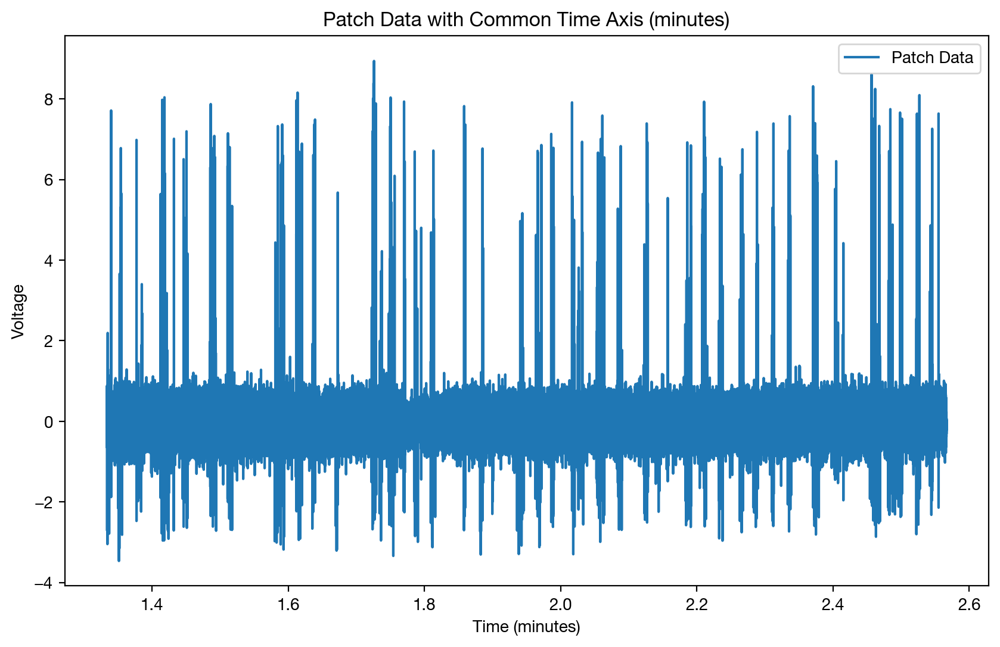

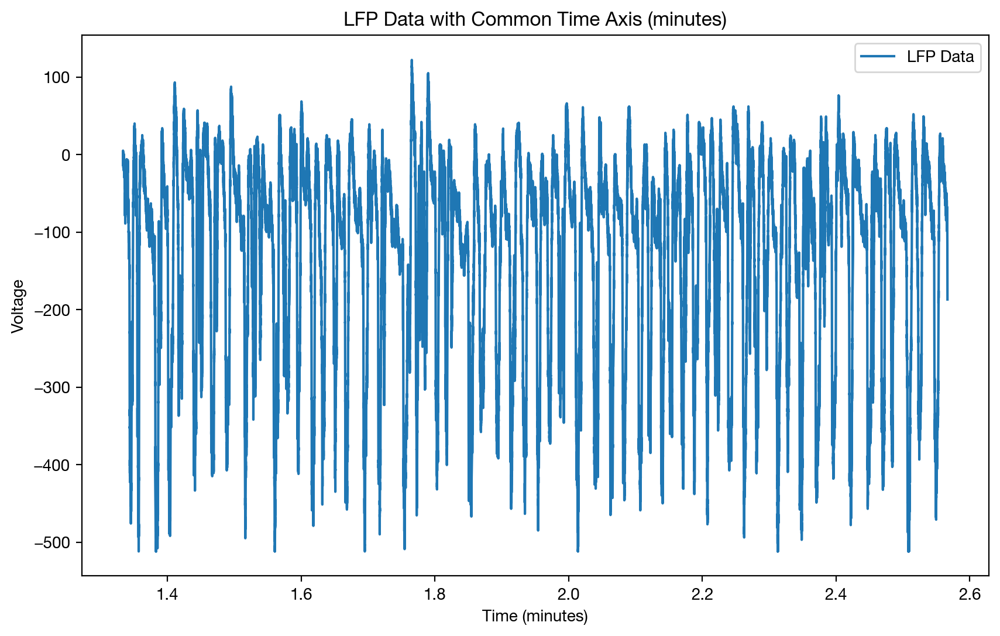

In [8]:
# Plot simultaneous patch and LFP data
# Convert time arrays to minutes
patch_times_min = patch_times / 60000  # Convert milliseconds to minutes
lfp_times_min = lfp_times / 60000  # Convert milliseconds to minutes

# Set the common time axis in minutes (e.g., from 13.3333 to 35.6667 minutes)
common_time_range_min = np.arange(80000 / 60000, 154000 / 60000, 1 / 60000)  # Adjust as needed

# Interpolate patch data onto the common time axis
patch_interp = np.interp(common_time_range_min, patch_times_min, patch_filt)

# Interpolate LFP data onto the common time axis
lfp_interp = np.interp(common_time_range_min, lfp_times_min, lfp_filt)

# Plot patch data with common time axis in minutes
plt.figure(figsize=(10, 6))
plt.plot(common_time_range_min, patch_interp, label='Patch Data')
plt.xlabel('Time (minutes)')
plt.ylabel('Voltage')
plt.title('Patch Data with Common Time Axis (minutes)')
plt.legend()
plt.show()

# Plot LFP data with common time axis in minutes
plt.figure(figsize=(10, 6))
plt.plot(common_time_range_min, lfp_interp, label='LFP Data')
plt.xlabel('Time (minutes)')
plt.ylabel('Voltage')
plt.title('LFP Data with Common Time Axis (minutes)')
plt.legend()
plt.show()

## STEP 1: Detect and fit spikes from patch data

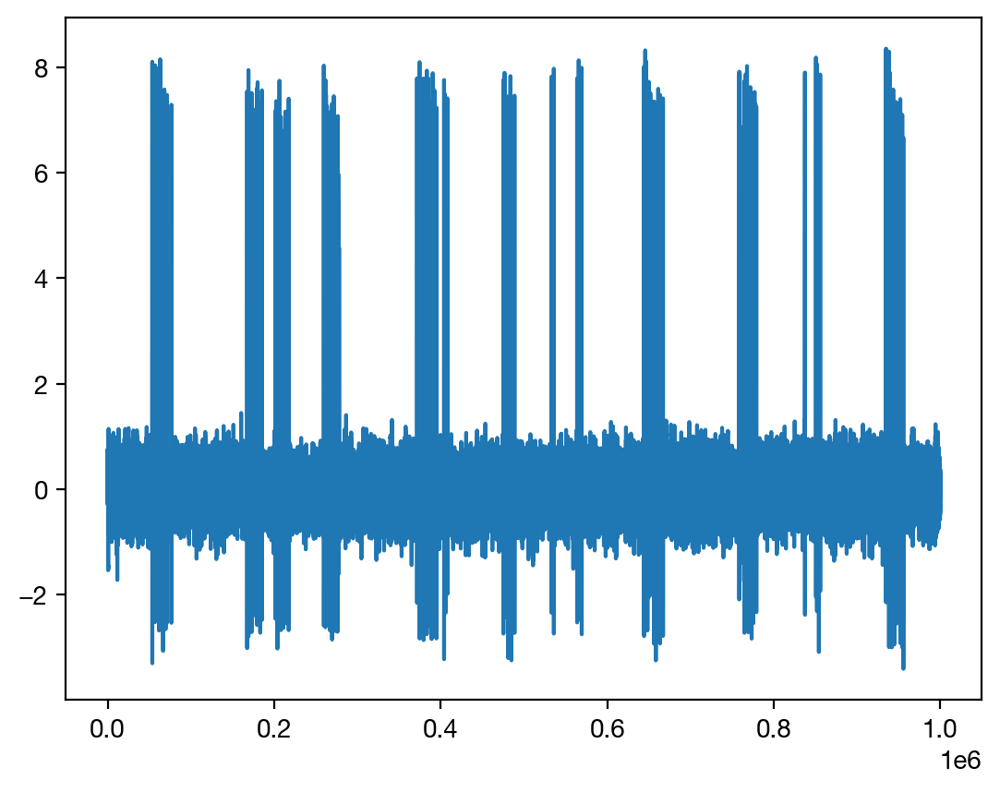

In [9]:
plt.plot(patch_filt[:1000000] )

In [10]:



#threshold in mVs
sp = Spike(thresh_amp=4, window_length=(5., 5.), smooth_frac=.01)

In [11]:
#CHANGE FOR EACH CELL
sp.fit(patch_filt, patch_fs, n_jobs=-1, progress=tqdm, flip_signal=False)


Spike:   0%|          | 0/12561 [00:00<?, ?it/s]


Spike:   0%|          | 1/12561 [00:05<20:06:51,  5.77s/it]


Spike:   0%|          | 2/12561 [00:05<8:34:16,  2.46s/it] 


Spike:   0%|          | 23/12561 [00:06<29:00,  7.20it/s] 


Spike:   0%|          | 35/12561 [00:06<17:10, 12.16it/s]


Spike:   0%|          | 44/12561 [00:06<12:32, 16.63it/s]


Spike:   0%|          | 53/12561 [00:06<09:24, 22.17it/s]


Spike:   0%|          | 62/12561 [00:06<07:19, 28.46it/s]


Spike:   1%|          | 74/12561 [00:06<05:18, 39.20it/s]


Spike:   1%|          | 83/12561 [00:06<04:38, 44.75it/s]


Spike:   1%|          | 92/12561 [00:06<04:07, 50.46it/s]


Spike:   1%|          | 102/12561 [00:06<03:33, 58.37it/s]


Spike:   1%|          | 112/12561 [00:07<03:08, 66.15it/s]


Spike:   1%|          | 121/12561 [00:07<03:03, 67.74it/s]


Spike:   1%|          | 130/12561 [00:07<02:56, 70.33it/s]


Spike:   1%|          | 139/12561 [00:07<02:46, 74.51it/s]


Spike:   1%|          | 148/12561 [00:07<02:43, 76.10it/s]


Spike:   1%|▏         | 159/12561 [00:07<02:29, 82.75it/s]


Spike:   1%|▏         | 168/12561 [00:07<02:39, 77.58it/s]


Spike:   1%|▏         | 177/12561 [00:07<02:52, 71.61it/s]


Spike:   1%|▏         | 186/12561 [00:08<03:46, 54.68it/s]


Spike:   2%|▏         | 212/12561 [00:08<02:09, 95.20it/s]


Spike:   2%|▏         | 224/12561 [00:08<02:14, 91.66it/s]


Spike:   2%|▏         | 235/12561 [00:08<02:21, 87.39it/s]


Spike:   2%|▏         | 245/12561 [00:08<02:30, 81.95it/s]


Spike:   2%|▏         | 254/12561 [00:08<02:28, 83.01it/s]


Spike:   2%|▏         | 263/12561 [00:08<02:27, 83.59it/s]


Spike:   2%|▏         | 272/12561 [00:09<02:30, 81.56it/s]


Spike:   2%|▏         | 281/12561 [00:09<02:26, 83.67it/s]


Spike:   2%|▏         | 290/12561 [00:09<02:33, 79.80it/s]


Spike:   2%|▏         | 301/12561 [00:09<02:30, 81.50it/s]


Spike:   2%|▏         | 311/12561 [00:09<02:30, 81.54it/s]


Spike:   3%|▎         | 320/12561 [00:09<02:49, 72.10it/s]


Spike:   3%|▎         | 328/12561 [00:09<02:51, 71.44it/s]


Spike:   3%|▎         | 336/12561 [00:09<03:17, 61.76it/s]


Spike:   3%|▎         | 351/12561 [00:10<02:29, 81.50it/s]


Spike:   3%|▎         | 360/12561 [00:10<02:39, 76.64it/s]


Spike:   3%|▎         | 369/12561 [00:10<02:51, 70.89it/s]


Spike:   3%|▎         | 380/12561 [00:10<02:34, 78.84it/s]


Spike:   3%|▎         | 389/12561 [00:10<02:36, 77.94it/s]


Spike:   3%|▎         | 398/12561 [00:10<02:37, 77.16it/s]


Spike:   3%|▎         | 407/12561 [00:10<02:37, 77.33it/s]


Spike:   3%|▎         | 416/12561 [00:10<02:44, 73.71it/s]


Spike:   3%|▎         | 428/12561 [00:11<02:24, 84.01it/s]


Spike:   3%|▎         | 437/12561 [00:11<02:22, 84.84it/s]


Spike:   4%|▎         | 446/12561 [00:11<02:28, 81.50it/s]


Spike:   4%|▎         | 457/12561 [00:11<02:28, 81.51it/s]


Spike:   4%|▎         | 466/12561 [00:11<03:23, 59.48it/s]


Spike:   4%|▍         | 475/12561 [00:11<03:38, 55.25it/s]


Spike:   4%|▍         | 482/12561 [00:12<03:34, 56.21it/s]


Spike:   4%|▍         | 489/12561 [00:12<03:36, 55.71it/s]


Spike:   4%|▍         | 495/12561 [00:12<03:49, 52.60it/s]


Spike:   4%|▍         | 501/12561 [00:12<03:56, 51.05it/s]


Spike:   4%|▍         | 508/12561 [00:12<03:37, 55.49it/s]


Spike:   4%|▍         | 516/12561 [00:12<03:22, 59.40it/s]


Spike:   4%|▍         | 524/12561 [00:12<03:09, 63.51it/s]


Spike:   4%|▍         | 533/12561 [00:12<02:52, 69.65it/s]


Spike:   4%|▍         | 542/12561 [00:12<02:53, 69.43it/s]


Spike:   4%|▍         | 550/12561 [00:13<02:58, 67.32it/s]


Spike:   4%|▍         | 557/12561 [00:13<03:09, 63.50it/s]


Spike:   4%|▍         | 565/12561 [00:13<03:03, 65.34it/s]


Spike:   5%|▍         | 572/12561 [00:13<03:14, 61.52it/s]


Spike:   5%|▍         | 581/12561 [00:13<03:02, 65.55it/s]


Spike:   5%|▍         | 594/12561 [00:13<02:44, 72.86it/s]


Spike:   5%|▍         | 602/12561 [00:13<02:45, 72.10it/s]


Spike:   5%|▍         | 611/12561 [00:13<02:42, 73.63it/s]


Spike:   5%|▍         | 620/12561 [00:14<02:41, 74.11it/s]


Spike:   5%|▌         | 629/12561 [00:14<02:39, 74.93it/s]


Spike:   5%|▌         | 637/12561 [00:14<02:44, 72.52it/s]


Spike:   5%|▌         | 645/12561 [00:14<02:53, 68.75it/s]


Spike:   5%|▌         | 655/12561 [00:14<02:44, 72.49it/s]


Spike:   5%|▌         | 663/12561 [00:14<02:47, 70.89it/s]


Spike:   5%|▌         | 671/12561 [00:14<02:47, 70.80it/s]


Spike:   5%|▌         | 680/12561 [00:14<02:45, 71.82it/s]


Spike:   5%|▌         | 688/12561 [00:15<02:42, 73.03it/s]


Spike:   6%|▌         | 696/12561 [00:15<02:44, 72.15it/s]


Spike:   6%|▌         | 708/12561 [00:15<02:25, 81.30it/s]


Spike:   6%|▌         | 717/12561 [00:15<02:23, 82.36it/s]


Spike:   6%|▌         | 726/12561 [00:15<02:43, 72.42it/s]


Spike:   6%|▌         | 734/12561 [00:15<03:59, 49.35it/s]


Spike:   6%|▌         | 744/12561 [00:15<03:23, 58.16it/s]


Spike:   6%|▌         | 751/12561 [00:16<03:34, 55.11it/s]


Spike:   6%|▌         | 758/12561 [00:16<03:39, 53.88it/s]


Spike:   6%|▌         | 765/12561 [00:16<03:25, 57.44it/s]


Spike:   6%|▌         | 772/12561 [00:16<03:31, 55.77it/s]


Spike:   6%|▌         | 779/12561 [00:16<03:25, 57.30it/s]


Spike:   6%|▋         | 787/12561 [00:16<03:30, 56.04it/s]


Spike:   6%|▋         | 796/12561 [00:16<03:17, 59.68it/s]


Spike:   6%|▋         | 804/12561 [00:16<03:13, 60.78it/s]


Spike:   6%|▋         | 814/12561 [00:17<03:08, 62.39it/s]


Spike:   7%|▋         | 823/12561 [00:17<02:53, 67.52it/s]


Spike:   7%|▋         | 831/12561 [00:17<02:49, 69.22it/s]


Spike:   7%|▋         | 840/12561 [00:17<02:53, 67.45it/s]


Spike:   7%|▋         | 850/12561 [00:17<02:42, 72.07it/s]


Spike:   7%|▋         | 858/12561 [00:17<02:38, 73.99it/s]


Spike:   7%|▋         | 866/12561 [00:17<02:37, 74.47it/s]


Spike:   7%|▋         | 874/12561 [00:17<02:39, 73.09it/s]


Spike:   7%|▋         | 882/12561 [00:18<02:37, 74.07it/s]


Spike:   7%|▋         | 891/12561 [00:18<02:31, 76.80it/s]


Spike:   7%|▋         | 900/12561 [00:18<02:24, 80.47it/s]


Spike:   7%|▋         | 909/12561 [00:18<02:28, 78.49it/s]


Spike:   7%|▋         | 919/12561 [00:18<02:39, 72.87it/s]


Spike:   7%|▋         | 929/12561 [00:18<02:35, 74.93it/s]


Spike:   7%|▋         | 937/12561 [00:18<02:38, 73.54it/s]


Spike:   8%|▊         | 947/12561 [00:18<02:44, 70.58it/s]


Spike:   8%|▊         | 962/12561 [00:19<02:16, 85.08it/s]


Spike:   8%|▊         | 971/12561 [00:19<02:25, 79.40it/s]


Spike:   8%|▊         | 982/12561 [00:19<02:13, 86.60it/s]


Spike:   8%|▊         | 992/12561 [00:19<02:21, 81.88it/s]


Spike:   8%|▊         | 1001/12561 [00:19<02:20, 82.32it/s]


Spike:   8%|▊         | 1010/12561 [00:19<02:21, 81.61it/s]


Spike:   8%|▊         | 1019/12561 [00:19<02:17, 83.79it/s]


Spike:   8%|▊         | 1028/12561 [00:19<02:21, 81.28it/s]


Spike:   8%|▊         | 1037/12561 [00:19<02:21, 81.24it/s]


Spike:   8%|▊         | 1049/12561 [00:20<02:26, 78.80it/s]


Spike:   8%|▊         | 1058/12561 [00:20<02:34, 74.56it/s]


Spike:   8%|▊         | 1067/12561 [00:20<02:26, 78.28it/s]


Spike:   9%|▊         | 1076/12561 [00:20<02:23, 79.95it/s]


Spike:   9%|▊         | 1085/12561 [00:20<02:29, 76.90it/s]


Spike:   9%|▊         | 1094/12561 [00:20<02:24, 79.45it/s]


Spike:   9%|▉         | 1103/12561 [00:20<02:27, 77.77it/s]


Spike:   9%|▉         | 1111/12561 [00:20<02:32, 75.11it/s]


Spike:   9%|▉         | 1119/12561 [00:21<02:38, 72.37it/s]


Spike:   9%|▉         | 1130/12561 [00:21<02:25, 78.81it/s]


Spike:   9%|▉         | 1138/12561 [00:21<02:26, 77.84it/s]


Spike:   9%|▉         | 1147/12561 [00:21<02:32, 74.76it/s]


Spike:   9%|▉         | 1158/12561 [00:21<02:18, 82.16it/s]


Spike:   9%|▉         | 1167/12561 [00:21<02:25, 78.42it/s]


Spike:   9%|▉         | 1176/12561 [00:21<02:24, 78.82it/s]


Spike:   9%|▉         | 1186/12561 [00:21<02:22, 80.00it/s]


Spike:  10%|▉         | 1197/12561 [00:21<02:11, 86.16it/s]


Spike:  10%|▉         | 1206/12561 [00:22<02:11, 86.23it/s]


Spike:  10%|▉         | 1215/12561 [00:22<02:15, 83.54it/s]


Spike:  10%|▉         | 1224/12561 [00:22<02:18, 81.93it/s]


Spike:  10%|▉         | 1233/12561 [00:22<02:15, 83.58it/s]


Spike:  10%|▉         | 1242/12561 [00:22<02:43, 69.05it/s]


Spike:  10%|▉         | 1256/12561 [00:22<02:24, 78.35it/s]


Spike:  10%|█         | 1267/12561 [00:22<02:23, 78.93it/s]


Spike:  10%|█         | 1276/12561 [00:23<02:28, 75.96it/s]


Spike:  10%|█         | 1284/12561 [00:23<02:33, 73.66it/s]


Spike:  10%|█         | 1294/12561 [00:23<02:21, 79.79it/s]


Spike:  10%|█         | 1304/12561 [00:23<02:25, 77.48it/s]


Spike:  10%|█         | 1313/12561 [00:23<02:30, 74.94it/s]


Spike:  11%|█         | 1321/12561 [00:23<02:27, 76.08it/s]


Spike:  11%|█         | 1330/12561 [00:23<02:23, 78.36it/s]


Spike:  11%|█         | 1338/12561 [00:23<02:32, 73.64it/s]


Spike:  11%|█         | 1347/12561 [00:23<02:30, 74.39it/s]


Spike:  11%|█         | 1355/12561 [00:24<02:44, 68.19it/s]


Spike:  11%|█         | 1368/12561 [00:24<02:20, 79.90it/s]


Spike:  11%|█         | 1377/12561 [00:24<02:22, 78.50it/s]


Spike:  11%|█         | 1385/12561 [00:24<02:37, 71.10it/s]


Spike:  11%|█         | 1394/12561 [00:24<02:39, 70.03it/s]


Spike:  11%|█         | 1405/12561 [00:24<02:21, 78.84it/s]


Spike:  11%|█▏        | 1414/12561 [00:24<02:21, 79.05it/s]


Spike:  11%|█▏        | 1423/12561 [00:24<02:27, 75.65it/s]


Spike:  11%|█▏        | 1431/12561 [00:25<02:36, 71.18it/s]


Spike:  11%|█▏        | 1443/12561 [00:25<02:32, 72.88it/s]


Spike:  12%|█▏        | 1451/12561 [00:25<02:31, 73.42it/s]


Spike:  12%|█▏        | 1461/12561 [00:25<02:18, 80.00it/s]


Spike:  12%|█▏        | 1470/12561 [00:25<02:37, 70.61it/s]


Spike:  12%|█▏        | 1479/12561 [00:25<02:33, 72.23it/s]


Spike:  12%|█▏        | 1487/12561 [00:25<02:56, 62.60it/s]


Spike:  12%|█▏        | 1501/12561 [00:26<02:18, 80.10it/s]


Spike:  12%|█▏        | 1511/12561 [00:26<02:27, 74.67it/s]


Spike:  12%|█▏        | 1520/12561 [00:26<02:22, 77.56it/s]


Spike:  12%|█▏        | 1529/12561 [00:26<02:22, 77.23it/s]


Spike:  12%|█▏        | 1538/12561 [00:26<02:29, 73.57it/s]


Spike:  12%|█▏        | 1551/12561 [00:26<02:09, 85.11it/s]


Spike:  12%|█▏        | 1562/12561 [00:26<02:25, 75.60it/s]


Spike:  12%|█▏        | 1570/12561 [00:26<02:28, 74.19it/s]


Spike:  13%|█▎        | 1578/12561 [00:27<02:27, 74.37it/s]


Spike:  13%|█▎        | 1591/12561 [00:27<02:07, 86.01it/s]


Spike:  13%|█▎        | 1600/12561 [00:27<02:09, 84.46it/s]


Spike:  13%|█▎        | 1609/12561 [00:27<02:15, 80.72it/s]


Spike:  13%|█▎        | 1620/12561 [00:27<02:18, 78.85it/s]


Spike:  13%|█▎        | 1629/12561 [00:27<02:22, 76.61it/s]


Spike:  13%|█▎        | 1643/12561 [00:27<02:01, 90.12it/s]


Spike:  13%|█▎        | 1653/12561 [00:27<02:05, 86.97it/s]


Spike:  13%|█▎        | 1662/12561 [00:28<02:08, 84.66it/s]


Spike:  13%|█▎        | 1671/12561 [00:28<02:27, 73.73it/s]


Spike:  13%|█▎        | 1679/12561 [00:28<02:32, 71.32it/s]


Spike:  13%|█▎        | 1688/12561 [00:28<02:24, 75.38it/s]


Spike:  14%|█▎        | 1696/12561 [00:28<02:40, 67.57it/s]


Spike:  14%|█▎        | 1705/12561 [00:28<02:34, 70.15it/s]


Spike:  14%|█▎        | 1715/12561 [00:28<02:30, 72.25it/s]


Spike:  14%|█▎        | 1723/12561 [00:28<02:26, 73.74it/s]


Spike:  14%|█▍        | 1732/12561 [00:29<02:19, 77.63it/s]


Spike:  14%|█▍        | 1740/12561 [00:29<02:20, 76.88it/s]


Spike:  14%|█▍        | 1750/12561 [00:29<02:16, 79.43it/s]


Spike:  14%|█▍        | 1758/12561 [00:29<02:15, 79.49it/s]


Spike:  14%|█▍        | 1766/12561 [00:29<02:28, 72.56it/s]


Spike:  14%|█▍        | 1774/12561 [00:29<02:29, 71.94it/s]


Spike:  14%|█▍        | 1782/12561 [00:29<02:27, 72.97it/s]


Spike:  14%|█▍        | 1793/12561 [00:29<02:19, 77.25it/s]


Spike:  14%|█▍        | 1801/12561 [00:29<02:18, 77.80it/s]


Spike:  14%|█▍        | 1814/12561 [00:30<02:07, 84.30it/s]


Spike:  15%|█▍        | 1823/12561 [00:30<02:27, 72.98it/s]


Spike:  15%|█▍        | 1833/12561 [00:30<02:20, 76.10it/s]


Spike:  15%|█▍        | 1845/12561 [00:30<02:07, 84.07it/s]


Spike:  15%|█▍        | 1858/12561 [00:30<01:54, 93.23it/s]


Spike:  15%|█▍        | 1868/12561 [00:30<02:07, 83.82it/s]


Spike:  15%|█▍        | 1877/12561 [00:30<02:08, 83.08it/s]


Spike:  15%|█▌        | 1886/12561 [00:30<02:10, 81.56it/s]


Spike:  15%|█▌        | 1900/12561 [00:31<01:55, 92.32it/s]


Spike:  15%|█▌        | 1910/12561 [00:31<02:06, 84.47it/s]


Spike:  15%|█▌        | 1920/12561 [00:31<02:02, 86.60it/s]


Spike:  15%|█▌        | 1929/12561 [00:31<02:02, 86.53it/s]


Spike:  15%|█▌        | 1939/12561 [00:31<02:00, 88.23it/s]


Spike:  16%|█▌        | 1948/12561 [00:31<02:06, 83.70it/s]


Spike:  16%|█▌        | 1960/12561 [00:31<02:01, 87.21it/s]


Spike:  16%|█▌        | 1969/12561 [00:31<02:02, 86.68it/s]


Spike:  16%|█▌        | 1978/12561 [00:32<02:07, 82.88it/s]


Spike:  16%|█▌        | 1988/12561 [00:32<02:09, 81.83it/s]


Spike:  16%|█▌        | 1997/12561 [00:32<02:09, 81.87it/s]


Spike:  16%|█▌        | 2006/12561 [00:32<02:09, 81.25it/s]


Spike:  16%|█▌        | 2016/12561 [00:32<02:02, 85.99it/s]


Spike:  16%|█▌        | 2026/12561 [00:32<02:38, 66.45it/s]


Spike:  16%|█▌        | 2041/12561 [00:32<02:15, 77.64it/s]


Spike:  16%|█▋        | 2051/12561 [00:32<02:07, 82.13it/s]


Spike:  16%|█▋        | 2061/12561 [00:33<02:12, 79.54it/s]


Spike:  16%|█▋        | 2070/12561 [00:33<02:17, 76.50it/s]


Spike:  17%|█▋        | 2080/12561 [00:33<02:12, 79.29it/s]


Spike:  17%|█▋        | 2090/12561 [00:33<02:11, 79.67it/s]


Spike:  17%|█▋        | 2099/12561 [00:33<02:17, 75.97it/s]


Spike:  17%|█▋        | 2107/12561 [00:33<02:30, 69.34it/s]


Spike:  17%|█▋        | 2118/12561 [00:33<02:20, 74.11it/s]


Spike:  17%|█▋        | 2128/12561 [00:33<02:16, 76.50it/s]


Spike:  17%|█▋        | 2137/12561 [00:34<02:21, 73.42it/s]


Spike:  17%|█▋        | 2149/12561 [00:34<02:15, 76.99it/s]


Spike:  17%|█▋        | 2158/12561 [00:34<02:11, 79.20it/s]


Spike:  17%|█▋        | 2166/12561 [00:34<02:16, 76.42it/s]


Spike:  17%|█▋        | 2177/12561 [00:34<02:02, 84.59it/s]


Spike:  17%|█▋        | 2186/12561 [00:34<02:08, 80.95it/s]


Spike:  17%|█▋        | 2195/12561 [00:34<02:13, 77.67it/s]


Spike:  18%|█▊        | 2204/12561 [00:34<02:20, 73.63it/s]


Spike:  18%|█▊        | 2212/12561 [00:35<02:34, 66.90it/s]


Spike:  18%|█▊        | 2225/12561 [00:35<02:10, 78.95it/s]


Spike:  18%|█▊        | 2234/12561 [00:35<02:52, 59.91it/s]


Spike:  18%|█▊        | 2247/12561 [00:35<02:23, 71.83it/s]


Spike:  18%|█▊        | 2256/12561 [00:35<03:09, 54.49it/s]


Spike:  18%|█▊        | 2268/12561 [00:35<02:39, 64.55it/s]


Spike:  18%|█▊        | 2280/12561 [00:36<02:20, 73.29it/s]


Spike:  18%|█▊        | 2293/12561 [00:36<02:00, 85.17it/s]


Spike:  18%|█▊        | 2303/12561 [00:36<03:10, 53.77it/s]


Spike:  18%|█▊        | 2322/12561 [00:36<02:24, 70.87it/s]


Spike:  19%|█▊        | 2332/12561 [00:36<02:33, 66.52it/s]


Spike:  19%|█▊        | 2341/12561 [00:37<02:30, 67.89it/s]


Spike:  19%|█▊        | 2350/12561 [00:37<02:22, 71.51it/s]


Spike:  19%|█▉        | 2359/12561 [00:37<02:17, 74.15it/s]


Spike:  19%|█▉        | 2368/12561 [00:37<02:17, 74.02it/s]


Spike:  19%|█▉        | 2376/12561 [00:37<02:21, 71.85it/s]


Spike:  19%|█▉        | 2384/12561 [00:37<02:23, 71.12it/s]


Spike:  19%|█▉        | 2395/12561 [00:37<02:16, 74.24it/s]


Spike:  19%|█▉        | 2404/12561 [00:37<02:14, 75.70it/s]


Spike:  19%|█▉        | 2412/12561 [00:37<02:16, 74.17it/s]


Spike:  19%|█▉        | 2422/12561 [00:38<02:10, 77.90it/s]


Spike:  19%|█▉        | 2431/12561 [00:38<02:07, 79.40it/s]


Spike:  19%|█▉        | 2441/12561 [00:38<02:19, 72.33it/s]


Spike:  20%|█▉        | 2453/12561 [00:38<02:04, 81.28it/s]


Spike:  20%|█▉        | 2462/12561 [00:38<02:16, 73.80it/s]


Spike:  20%|█▉        | 2475/12561 [00:38<01:58, 85.03it/s]


Spike:  20%|█▉        | 2484/12561 [00:38<02:06, 79.41it/s]


Spike:  20%|█▉        | 2493/12561 [00:38<02:09, 77.47it/s]


Spike:  20%|█▉        | 2506/12561 [00:39<02:03, 81.56it/s]


Spike:  20%|██        | 2515/12561 [00:39<02:01, 82.48it/s]


Spike:  20%|██        | 2524/12561 [00:39<02:08, 78.35it/s]


Spike:  20%|██        | 2536/12561 [00:39<01:56, 86.23it/s]


Spike:  20%|██        | 2545/12561 [00:39<02:02, 81.93it/s]


Spike:  20%|██        | 2556/12561 [00:39<01:53, 88.47it/s]


Spike:  20%|██        | 2565/12561 [00:39<01:53, 87.73it/s]


Spike:  20%|██        | 2574/12561 [00:39<01:53, 87.93it/s]


Spike:  21%|██        | 2583/12561 [00:40<02:01, 82.19it/s]


Spike:  21%|██        | 2593/12561 [00:40<01:57, 85.05it/s]


Spike:  21%|██        | 2602/12561 [00:40<01:57, 84.53it/s]


Spike:  21%|██        | 2611/12561 [00:40<02:03, 80.50it/s]


Spike:  21%|██        | 2624/12561 [00:40<01:58, 83.94it/s]


Spike:  21%|██        | 2634/12561 [00:40<01:57, 84.59it/s]


Spike:  21%|██        | 2643/12561 [00:40<01:58, 83.97it/s]


Spike:  21%|██        | 2655/12561 [00:40<01:55, 85.63it/s]


Spike:  21%|██        | 2664/12561 [00:41<02:03, 79.96it/s]


Spike:  21%|██▏       | 2674/12561 [00:41<01:56, 84.59it/s]


Spike:  21%|██▏       | 2683/12561 [00:41<02:17, 71.80it/s]


Spike:  21%|██▏       | 2691/12561 [00:41<02:15, 72.98it/s]


Spike:  22%|██▏       | 2702/12561 [00:41<02:04, 79.15it/s]


Spike:  22%|██▏       | 2711/12561 [00:41<02:02, 80.19it/s]


Spike:  22%|██▏       | 2721/12561 [00:41<02:03, 79.74it/s]


Spike:  22%|██▏       | 2730/12561 [00:41<02:01, 81.16it/s]


Spike:  22%|██▏       | 2742/12561 [00:41<01:49, 89.83it/s]


Spike:  22%|██▏       | 2752/12561 [00:42<02:06, 77.58it/s]


Spike:  22%|██▏       | 2763/12561 [00:42<01:55, 85.09it/s]


Spike:  22%|██▏       | 2775/12561 [00:42<01:51, 87.91it/s]


Spike:  22%|██▏       | 2786/12561 [00:42<01:47, 91.04it/s]


Spike:  22%|██▏       | 2796/12561 [00:42<01:51, 87.61it/s]


Spike:  22%|██▏       | 2805/12561 [00:42<01:52, 86.91it/s]


Spike:  22%|██▏       | 2814/12561 [00:42<01:54, 85.26it/s]


Spike:  22%|██▏       | 2823/12561 [00:42<01:54, 85.04it/s]


Spike:  23%|██▎       | 2832/12561 [00:43<02:04, 77.88it/s]


Spike:  23%|██▎       | 2845/12561 [00:43<02:00, 80.69it/s]


Spike:  23%|██▎       | 2858/12561 [00:43<02:03, 78.86it/s]


Spike:  23%|██▎       | 2872/12561 [00:43<01:46, 91.38it/s]


Spike:  23%|██▎       | 2882/12561 [00:43<01:48, 88.98it/s]


Spike:  23%|██▎       | 2892/12561 [00:43<01:48, 89.46it/s]


Spike:  23%|██▎       | 2902/12561 [00:43<02:07, 75.60it/s]


Spike:  23%|██▎       | 2910/12561 [00:44<02:12, 72.75it/s]


Spike:  23%|██▎       | 2918/12561 [00:44<02:20, 68.83it/s]


Spike:  23%|██▎       | 2926/12561 [00:44<02:19, 69.17it/s]


Spike:  23%|██▎       | 2934/12561 [00:44<02:33, 62.55it/s]


Spike:  23%|██▎       | 2946/12561 [00:44<02:26, 65.59it/s]


Spike:  24%|██▎       | 2957/12561 [00:44<02:09, 74.37it/s]


Spike:  24%|██▎       | 2967/12561 [00:44<02:05, 76.65it/s]


Spike:  24%|██▎       | 2975/12561 [00:45<02:28, 64.52it/s]


Spike:  24%|██▎       | 2982/12561 [00:45<02:36, 61.19it/s]


Spike:  24%|██▍       | 2995/12561 [00:45<02:22, 67.03it/s]


Spike:  24%|██▍       | 3004/12561 [00:45<02:20, 68.24it/s]


Spike:  24%|██▍       | 3013/12561 [00:45<02:11, 72.78it/s]


Spike:  24%|██▍       | 3023/12561 [00:45<02:04, 76.51it/s]


Spike:  24%|██▍       | 3032/12561 [00:45<02:02, 77.61it/s]


Spike:  24%|██▍       | 3040/12561 [00:45<02:06, 75.02it/s]


Spike:  24%|██▍       | 3050/12561 [00:46<01:59, 79.34it/s]


Spike:  24%|██▍       | 3059/12561 [00:46<01:56, 81.72it/s]


Spike:  24%|██▍       | 3068/12561 [00:46<02:01, 78.06it/s]


Spike:  25%|██▍       | 3078/12561 [00:46<02:06, 75.18it/s]


Spike:  25%|██▍       | 3086/12561 [00:46<02:07, 74.05it/s]


Spike:  25%|██▍       | 3094/12561 [00:46<02:15, 70.07it/s]


Spike:  25%|██▍       | 3104/12561 [00:46<02:02, 77.01it/s]


Spike:  25%|██▍       | 3112/12561 [00:47<03:12, 49.05it/s]


Spike:  25%|██▍       | 3132/12561 [00:47<02:03, 76.55it/s]


Spike:  25%|██▌       | 3142/12561 [00:47<02:02, 77.17it/s]


Spike:  25%|██▌       | 3152/12561 [00:47<02:05, 74.86it/s]


Spike:  25%|██▌       | 3163/12561 [00:47<01:57, 79.73it/s]


Spike:  25%|██▌       | 3172/12561 [00:47<01:58, 79.03it/s]


Spike:  25%|██▌       | 3181/12561 [00:47<02:13, 70.39it/s]


Spike:  25%|██▌       | 3189/12561 [00:47<02:18, 67.53it/s]


Spike:  25%|██▌       | 3203/12561 [00:48<01:52, 83.19it/s]


Spike:  26%|██▌       | 3212/12561 [00:48<01:52, 83.01it/s]


Spike:  26%|██▌       | 3222/12561 [00:48<01:53, 82.37it/s]


Spike:  26%|██▌       | 3231/12561 [00:48<02:02, 75.88it/s]


Spike:  26%|██▌       | 3244/12561 [00:48<01:50, 84.31it/s]


Spike:  26%|██▌       | 3254/12561 [00:48<01:47, 86.75it/s]


Spike:  26%|██▌       | 3263/12561 [00:48<01:52, 82.56it/s]


Spike:  26%|██▌       | 3272/12561 [00:48<01:53, 81.59it/s]


Spike:  26%|██▌       | 3281/12561 [00:49<01:52, 82.18it/s]


Spike:  26%|██▌       | 3293/12561 [00:49<01:40, 92.05it/s]


Spike:  26%|██▋       | 3303/12561 [00:49<01:50, 84.03it/s]


Spike:  26%|██▋       | 3314/12561 [00:49<01:46, 87.02it/s]


Spike:  26%|██▋       | 3324/12561 [00:49<01:54, 80.99it/s]


Spike:  27%|██▋       | 3335/12561 [00:49<01:44, 88.07it/s]


Spike:  27%|██▋       | 3345/12561 [00:49<01:48, 85.09it/s]


Spike:  27%|██▋       | 3354/12561 [00:49<02:12, 69.26it/s]


Spike:  27%|██▋       | 3364/12561 [00:50<02:16, 67.42it/s]


Spike:  27%|██▋       | 3374/12561 [00:50<02:03, 74.33it/s]


Spike:  27%|██▋       | 3382/12561 [00:50<02:04, 74.00it/s]


Spike:  27%|██▋       | 3393/12561 [00:50<01:57, 77.90it/s]


Spike:  27%|██▋       | 3402/12561 [00:50<01:58, 77.04it/s]


Spike:  27%|██▋       | 3411/12561 [00:50<01:54, 80.09it/s]


Spike:  27%|██▋       | 3420/12561 [00:50<01:52, 81.11it/s]


Spike:  27%|██▋       | 3429/12561 [00:50<01:51, 81.64it/s]


Spike:  27%|██▋       | 3440/12561 [00:51<01:50, 82.20it/s]


Spike:  27%|██▋       | 3449/12561 [00:51<01:55, 79.14it/s]


Spike:  28%|██▊       | 3461/12561 [00:51<01:49, 83.20it/s]


Spike:  28%|██▊       | 3472/12561 [00:51<01:43, 88.19it/s]


Spike:  28%|██▊       | 3484/12561 [00:51<01:46, 85.07it/s]


Spike:  28%|██▊       | 3494/12561 [00:51<01:45, 85.96it/s]


Spike:  28%|██▊       | 3508/12561 [00:51<01:34, 96.22it/s]


Spike:  28%|██▊       | 3518/12561 [00:51<01:53, 79.51it/s]


Spike:  28%|██▊       | 3533/12561 [00:52<01:40, 89.55it/s]


Spike:  28%|██▊       | 3543/12561 [00:52<01:44, 86.42it/s]


Spike:  28%|██▊       | 3555/12561 [00:52<01:40, 89.71it/s]


Spike:  28%|██▊       | 3565/12561 [00:52<01:39, 90.81it/s]


Spike:  28%|██▊       | 3575/12561 [00:52<01:45, 85.39it/s]


Spike:  29%|██▊       | 3586/12561 [00:52<01:45, 84.96it/s]


Spike:  29%|██▊       | 3596/12561 [00:52<01:54, 78.37it/s]


Spike:  29%|██▊       | 3610/12561 [00:52<01:37, 92.26it/s]


Spike:  29%|██▉       | 3620/12561 [00:53<01:45, 84.70it/s]


Spike:  29%|██▉       | 3635/12561 [00:53<01:29, 99.70it/s]


Spike:  29%|██▉       | 3646/12561 [00:53<01:35, 93.62it/s]


Spike:  29%|██▉       | 3656/12561 [00:53<01:47, 83.21it/s]


Spike:  29%|██▉       | 3668/12561 [00:53<01:39, 89.55it/s]


Spike:  29%|██▉       | 3678/12561 [00:53<01:47, 82.62it/s]


Spike:  29%|██▉       | 3689/12561 [00:53<01:41, 87.32it/s]


Spike:  29%|██▉       | 3699/12561 [00:54<01:54, 77.10it/s]


Spike:  30%|██▉       | 3710/12561 [00:54<01:47, 82.16it/s]


Spike:  30%|██▉       | 3721/12561 [00:54<01:40, 87.97it/s]


Spike:  30%|██▉       | 3733/12561 [00:54<01:33, 94.55it/s]


Spike:  30%|██▉       | 3743/12561 [00:54<01:47, 82.04it/s]


Spike:  30%|██▉       | 3755/12561 [00:54<01:40, 87.93it/s]


Spike:  30%|██▉       | 3765/12561 [00:54<01:40, 87.38it/s]


Spike:  30%|███       | 3775/12561 [00:54<01:55, 76.20it/s]


Spike:  30%|███       | 3787/12561 [00:55<01:46, 82.32it/s]


Spike:  30%|███       | 3796/12561 [00:55<02:19, 62.98it/s]


Spike:  30%|███       | 3814/12561 [00:55<01:42, 85.35it/s]


Spike:  30%|███       | 3824/12561 [00:55<01:44, 83.90it/s]


Spike:  31%|███       | 3835/12561 [00:55<01:39, 87.55it/s]


Spike:  31%|███       | 3845/12561 [00:55<01:42, 85.23it/s]


Spike:  31%|███       | 3855/12561 [00:55<01:51, 78.35it/s]


Spike:  31%|███       | 3868/12561 [00:56<01:38, 88.58it/s]


Spike:  31%|███       | 3878/12561 [00:56<02:12, 65.38it/s]


Spike:  31%|███       | 3895/12561 [00:56<01:40, 86.49it/s]


Spike:  31%|███       | 3906/12561 [00:56<01:48, 80.13it/s]


Spike:  31%|███       | 3916/12561 [00:56<01:44, 83.04it/s]


Spike:  31%|███▏      | 3926/12561 [00:56<01:49, 78.60it/s]


Spike:  31%|███▏      | 3937/12561 [00:56<01:42, 84.45it/s]


Spike:  31%|███▏      | 3947/12561 [00:57<01:43, 83.59it/s]


Spike:  31%|███▏      | 3956/12561 [00:57<01:41, 84.83it/s]


Spike:  32%|███▏      | 3967/12561 [00:57<01:37, 88.13it/s]


Spike:  32%|███▏      | 3977/12561 [00:57<01:40, 85.29it/s]


Spike:  32%|███▏      | 3986/12561 [00:57<01:42, 83.43it/s]


Spike:  32%|███▏      | 3995/12561 [00:57<01:43, 82.86it/s]


Spike:  32%|███▏      | 4006/12561 [00:57<01:40, 85.21it/s]


Spike:  32%|███▏      | 4015/12561 [00:57<01:43, 82.66it/s]


Spike:  32%|███▏      | 4025/12561 [00:57<01:41, 84.21it/s]


Spike:  32%|███▏      | 4036/12561 [00:58<01:37, 87.12it/s]


Spike:  32%|███▏      | 4046/12561 [00:58<01:39, 85.56it/s]


Spike:  32%|███▏      | 4055/12561 [00:58<01:42, 83.18it/s]


Spike:  32%|███▏      | 4065/12561 [00:58<01:42, 83.13it/s]


Spike:  32%|███▏      | 4075/12561 [00:58<01:40, 84.85it/s]


Spike:  33%|███▎      | 4084/12561 [00:58<01:39, 85.15it/s]


Spike:  33%|███▎      | 4093/12561 [00:58<01:43, 81.50it/s]


Spike:  33%|███▎      | 4103/12561 [00:58<01:40, 84.22it/s]


Spike:  33%|███▎      | 4112/12561 [00:58<01:45, 80.17it/s]


Spike:  33%|███▎      | 4121/12561 [00:59<01:47, 78.48it/s]


Spike:  33%|███▎      | 4129/12561 [00:59<01:54, 73.33it/s]


Spike:  33%|███▎      | 4137/12561 [00:59<02:05, 67.38it/s]


Spike:  33%|███▎      | 4146/12561 [00:59<01:59, 70.34it/s]


Spike:  33%|███▎      | 4157/12561 [00:59<01:54, 73.55it/s]


Spike:  33%|███▎      | 4167/12561 [00:59<01:45, 79.68it/s]


Spike:  33%|███▎      | 4176/12561 [00:59<02:03, 68.12it/s]


Spike:  33%|███▎      | 4189/12561 [01:00<01:44, 80.37it/s]


Spike:  33%|███▎      | 4199/12561 [01:00<01:44, 79.69it/s]


Spike:  34%|███▎      | 4208/12561 [01:00<01:46, 78.41it/s]


Spike:  34%|███▎      | 4220/12561 [01:00<01:40, 82.99it/s]


Spike:  34%|███▎      | 4230/12561 [01:00<01:38, 85.00it/s]


Spike:  34%|███▎      | 4239/12561 [01:00<01:39, 83.37it/s]


Spike:  34%|███▍      | 4248/12561 [01:00<01:45, 78.73it/s]


Spike:  34%|███▍      | 4260/12561 [01:00<01:34, 87.71it/s]


Spike:  34%|███▍      | 4269/12561 [01:01<01:40, 82.22it/s]


Spike:  34%|███▍      | 4278/12561 [01:01<01:44, 79.31it/s]


Spike:  34%|███▍      | 4287/12561 [01:01<01:43, 80.02it/s]


Spike:  34%|███▍      | 4296/12561 [01:01<01:49, 75.17it/s]


Spike:  34%|███▍      | 4304/12561 [01:01<01:53, 72.87it/s]


Spike:  34%|███▍      | 4313/12561 [01:01<01:48, 76.30it/s]


Spike:  34%|███▍      | 4325/12561 [01:01<01:37, 84.67it/s]


Spike:  35%|███▍      | 4334/12561 [01:01<01:44, 78.98it/s]


Spike:  35%|███▍      | 4345/12561 [01:01<01:43, 79.24it/s]


Spike:  35%|███▍      | 4356/12561 [01:02<01:39, 82.82it/s]


Spike:  35%|███▍      | 4369/12561 [01:02<01:30, 90.74it/s]


Spike:  35%|███▍      | 4379/12561 [01:02<01:44, 78.59it/s]


Spike:  35%|███▍      | 4389/12561 [01:02<01:40, 81.52it/s]


Spike:  35%|███▌      | 4399/12561 [01:02<01:41, 80.64it/s]


Spike:  35%|███▌      | 4409/12561 [01:02<01:37, 83.99it/s]


Spike:  35%|███▌      | 4418/12561 [01:02<01:48, 75.25it/s]


Spike:  35%|███▌      | 4426/12561 [01:02<01:46, 76.37it/s]


Spike:  35%|███▌      | 4435/12561 [01:03<01:44, 77.98it/s]


Spike:  35%|███▌      | 4446/12561 [01:03<01:35, 84.63it/s]


Spike:  35%|███▌      | 4455/12561 [01:03<01:36, 83.90it/s]


Spike:  36%|███▌      | 4464/12561 [01:03<01:36, 83.79it/s]


Spike:  36%|███▌      | 4473/12561 [01:03<01:45, 76.60it/s]


Spike:  36%|███▌      | 4481/12561 [01:03<01:45, 76.58it/s]


Spike:  36%|███▌      | 4494/12561 [01:03<01:41, 79.38it/s]


Spike:  36%|███▌      | 4503/12561 [01:03<01:41, 79.25it/s]


Spike:  36%|███▌      | 4516/12561 [01:04<01:42, 78.37it/s]


Spike:  36%|███▌      | 4531/12561 [01:04<01:28, 90.52it/s]


Spike:  36%|███▌      | 4541/12561 [01:04<01:39, 80.99it/s]


Spike:  36%|███▌      | 4553/12561 [01:04<01:34, 84.42it/s]


Spike:  36%|███▋      | 4562/12561 [01:04<01:36, 83.09it/s]


Spike:  36%|███▋      | 4571/12561 [01:04<01:39, 80.06it/s]


Spike:  36%|███▋      | 4580/12561 [01:04<01:45, 75.93it/s]


Spike:  37%|███▋      | 4593/12561 [01:05<01:34, 84.41it/s]


Spike:  37%|███▋      | 4604/12561 [01:05<01:35, 83.07it/s]


Spike:  37%|███▋      | 4613/12561 [01:05<01:55, 68.59it/s]


Spike:  37%|███▋      | 4621/12561 [01:05<01:58, 67.22it/s]


Spike:  37%|███▋      | 4629/12561 [01:05<01:57, 67.71it/s]


Spike:  37%|███▋      | 4636/12561 [01:05<02:02, 64.80it/s]


Spike:  37%|███▋      | 4643/12561 [01:05<02:33, 51.70it/s]


Spike:  37%|███▋      | 4654/12561 [01:06<02:12, 59.84it/s]


Spike:  37%|███▋      | 4662/12561 [01:06<02:03, 64.02it/s]


Spike:  37%|███▋      | 4669/12561 [01:06<02:16, 58.02it/s]


Spike:  37%|███▋      | 4676/12561 [01:06<02:14, 58.68it/s]


Spike:  37%|███▋      | 4684/12561 [01:06<02:07, 61.77it/s]


Spike:  37%|███▋      | 4691/12561 [01:06<02:38, 49.68it/s]


Spike:  37%|███▋      | 4706/12561 [01:06<01:52, 70.05it/s]


Spike:  38%|███▊      | 4717/12561 [01:06<01:41, 76.91it/s]


Spike:  38%|███▊      | 4726/12561 [01:07<01:39, 78.52it/s]


Spike:  38%|███▊      | 4735/12561 [01:07<01:43, 75.43it/s]


Spike:  38%|███▊      | 4746/12561 [01:07<01:37, 80.24it/s]


Spike:  38%|███▊      | 4755/12561 [01:07<01:45, 74.20it/s]


Spike:  38%|███▊      | 4764/12561 [01:07<01:50, 70.70it/s]


Spike:  38%|███▊      | 4773/12561 [01:07<01:51, 69.69it/s]


Spike:  38%|███▊      | 4784/12561 [01:07<01:52, 68.94it/s]


Spike:  38%|███▊      | 4798/12561 [01:08<01:35, 81.59it/s]


Spike:  38%|███▊      | 4809/12561 [01:08<01:40, 77.32it/s]


Spike:  38%|███▊      | 4824/12561 [01:08<01:33, 82.57it/s]


Spike:  38%|███▊      | 4833/12561 [01:08<01:32, 83.91it/s]


Spike:  39%|███▊      | 4844/12561 [01:08<01:36, 79.83it/s]


Spike:  39%|███▊      | 4855/12561 [01:08<01:31, 84.21it/s]


Spike:  39%|███▊      | 4864/12561 [01:08<01:32, 83.28it/s]


Spike:  39%|███▉      | 4874/12561 [01:09<01:39, 77.28it/s]


Spike:  39%|███▉      | 4889/12561 [01:09<01:23, 91.64it/s]


Spike:  39%|███▉      | 4899/12561 [01:09<01:31, 83.89it/s]


Spike:  39%|███▉      | 4909/12561 [01:09<01:29, 85.62it/s]


Spike:  39%|███▉      | 4918/12561 [01:09<01:32, 83.00it/s]


Spike:  39%|███▉      | 4927/12561 [01:09<01:37, 78.63it/s]


Spike:  39%|███▉      | 4939/12561 [01:09<01:41, 74.74it/s]


Spike:  39%|███▉      | 4949/12561 [01:09<01:39, 76.85it/s]


Spike:  40%|███▉      | 4963/12561 [01:10<01:25, 88.78it/s]


Spike:  40%|███▉      | 4973/12561 [01:10<01:29, 84.32it/s]


Spike:  40%|███▉      | 4982/12561 [01:10<01:34, 80.49it/s]


Spike:  40%|███▉      | 4992/12561 [01:10<01:31, 82.67it/s]


Spike:  40%|███▉      | 5001/12561 [01:10<01:38, 77.06it/s]


Spike:  40%|███▉      | 5009/12561 [01:10<01:47, 70.11it/s]


Spike:  40%|███▉      | 5021/12561 [01:10<01:35, 78.80it/s]


Spike:  40%|████      | 5031/12561 [01:10<01:34, 79.55it/s]


Spike:  40%|████      | 5041/12561 [01:11<01:38, 76.08it/s]


Spike:  40%|████      | 5050/12561 [01:11<01:37, 76.86it/s]


Spike:  40%|████      | 5058/12561 [01:11<01:39, 75.41it/s]


Spike:  40%|████      | 5066/12561 [01:11<01:44, 71.38it/s]


Spike:  40%|████      | 5080/12561 [01:11<01:26, 86.93it/s]


Spike:  41%|████      | 5089/12561 [01:11<01:41, 73.76it/s]


Spike:  41%|████      | 5098/12561 [01:11<01:48, 68.92it/s]


Spike:  41%|████      | 5107/12561 [01:11<01:41, 73.66it/s]


Spike:  41%|████      | 5117/12561 [01:12<01:34, 78.83it/s]


Spike:  41%|████      | 5126/12561 [01:12<01:31, 81.03it/s]


Spike:  41%|████      | 5135/12561 [01:12<01:40, 73.67it/s]


Spike:  41%|████      | 5143/12561 [01:12<01:45, 70.15it/s]


Spike:  41%|████      | 5151/12561 [01:12<01:44, 70.71it/s]


Spike:  41%|████      | 5160/12561 [01:12<01:38, 75.42it/s]


Spike:  41%|████      | 5168/12561 [01:12<01:44, 70.63it/s]


Spike:  41%|████      | 5176/12561 [01:12<01:42, 71.98it/s]


Spike:  41%|████▏     | 5186/12561 [01:13<01:34, 77.95it/s]


Spike:  41%|████▏     | 5194/12561 [01:13<01:36, 76.67it/s]


Spike:  41%|████▏     | 5202/12561 [01:13<01:54, 64.13it/s]


Spike:  42%|████▏     | 5213/12561 [01:13<01:42, 71.99it/s]


Spike:  42%|████▏     | 5223/12561 [01:13<01:36, 76.12it/s]


Spike:  42%|████▏     | 5233/12561 [01:13<01:32, 79.35it/s]


Spike:  42%|████▏     | 5242/12561 [01:13<01:32, 78.76it/s]


Spike:  42%|████▏     | 5253/12561 [01:13<01:36, 75.47it/s]


Spike:  42%|████▏     | 5265/12561 [01:14<01:26, 84.57it/s]


Spike:  42%|████▏     | 5276/12561 [01:14<01:25, 84.90it/s]


Spike:  42%|████▏     | 5285/12561 [01:14<01:32, 78.69it/s]


Spike:  42%|████▏     | 5294/12561 [01:14<01:32, 78.35it/s]


Spike:  42%|████▏     | 5302/12561 [01:14<01:55, 62.64it/s]


Spike:  42%|████▏     | 5319/12561 [01:14<01:30, 79.99it/s]


Spike:  42%|████▏     | 5334/12561 [01:14<01:24, 85.82it/s]


Spike:  43%|████▎     | 5343/12561 [01:15<01:25, 84.51it/s]


Spike:  43%|████▎     | 5356/12561 [01:15<01:17, 92.77it/s]


Spike:  43%|████▎     | 5366/12561 [01:15<01:26, 82.90it/s]


Spike:  43%|████▎     | 5376/12561 [01:15<01:23, 86.43it/s]


Spike:  43%|████▎     | 5386/12561 [01:15<01:22, 86.72it/s]


Spike:  43%|████▎     | 5395/12561 [01:15<01:24, 84.32it/s]


Spike:  43%|████▎     | 5405/12561 [01:15<01:21, 88.20it/s]


Spike:  43%|████▎     | 5414/12561 [01:15<01:23, 85.65it/s]


Spike:  43%|████▎     | 5423/12561 [01:15<01:23, 85.12it/s]


Spike:  43%|████▎     | 5432/12561 [01:16<01:26, 82.71it/s]


Spike:  43%|████▎     | 5441/12561 [01:16<01:24, 84.46it/s]


Spike:  43%|████▎     | 5450/12561 [01:16<01:26, 82.66it/s]


Spike:  43%|████▎     | 5460/12561 [01:16<01:22, 85.62it/s]


Spike:  44%|████▎     | 5469/12561 [01:16<01:30, 78.05it/s]


Spike:  44%|████▎     | 5477/12561 [01:16<01:34, 74.86it/s]


Spike:  44%|████▎     | 5487/12561 [01:16<01:33, 75.65it/s]


Spike:  44%|████▍     | 5499/12561 [01:16<01:27, 80.89it/s]


Spike:  44%|████▍     | 5509/12561 [01:16<01:23, 84.93it/s]


Spike:  44%|████▍     | 5521/12561 [01:17<01:33, 75.42it/s]


Spike:  44%|████▍     | 5536/12561 [01:17<01:19, 88.16it/s]


Spike:  44%|████▍     | 5546/12561 [01:17<01:18, 89.22it/s]


Spike:  44%|████▍     | 5557/12561 [01:17<01:23, 83.98it/s]


Spike:  44%|████▍     | 5566/12561 [01:17<01:25, 82.03it/s]


Spike:  44%|████▍     | 5575/12561 [01:17<01:28, 79.17it/s]


Spike:  44%|████▍     | 5584/12561 [01:17<01:25, 81.50it/s]


Spike:  45%|████▍     | 5593/12561 [01:18<01:27, 79.91it/s]


Spike:  45%|████▍     | 5602/12561 [01:18<01:26, 80.20it/s]


Spike:  45%|████▍     | 5612/12561 [01:18<01:30, 76.48it/s]


Spike:  45%|████▍     | 5622/12561 [01:18<01:25, 81.40it/s]


Spike:  45%|████▍     | 5631/12561 [01:18<01:25, 81.25it/s]


Spike:  45%|████▍     | 5642/12561 [01:18<01:18, 87.96it/s]


Spike:  45%|████▍     | 5651/12561 [01:18<01:31, 75.74it/s]


Spike:  45%|████▌     | 5660/12561 [01:18<01:31, 75.47it/s]


Spike:  45%|████▌     | 5669/12561 [01:18<01:29, 77.43it/s]


Spike:  45%|████▌     | 5680/12561 [01:19<01:21, 84.34it/s]


Spike:  45%|████▌     | 5689/12561 [01:19<01:24, 81.57it/s]


Spike:  45%|████▌     | 5700/12561 [01:19<01:21, 84.01it/s]


Spike:  45%|████▌     | 5709/12561 [01:19<01:21, 84.31it/s]


Spike:  46%|████▌     | 5718/12561 [01:19<01:29, 76.87it/s]


Spike:  46%|████▌     | 5730/12561 [01:19<01:27, 77.90it/s]


Spike:  46%|████▌     | 5740/12561 [01:19<01:24, 80.25it/s]


Spike:  46%|████▌     | 5751/12561 [01:19<01:23, 81.36it/s]


Spike:  46%|████▌     | 5760/12561 [01:20<01:30, 74.82it/s]


Spike:  46%|████▌     | 5773/12561 [01:20<01:16, 88.19it/s]


Spike:  46%|████▌     | 5783/12561 [01:20<01:18, 86.50it/s]


Spike:  46%|████▌     | 5793/12561 [01:20<01:16, 87.96it/s]


Spike:  46%|████▌     | 5802/12561 [01:20<01:18, 86.35it/s]


Spike:  46%|████▋     | 5811/12561 [01:20<01:20, 84.29it/s]


Spike:  46%|████▋     | 5822/12561 [01:20<01:22, 81.22it/s]


Spike:  46%|████▋     | 5831/12561 [01:20<01:21, 82.80it/s]


Spike:  47%|████▋     | 5841/12561 [01:21<01:41, 66.24it/s]


Spike:  47%|████▋     | 5854/12561 [01:21<01:24, 79.56it/s]


Spike:  47%|████▋     | 5865/12561 [01:21<01:17, 86.60it/s]


Spike:  47%|████▋     | 5883/12561 [01:21<01:01, 108.45it/s]


Spike:  47%|████▋     | 5901/12561 [01:21<00:54, 122.32it/s]


Spike:  47%|████▋     | 5916/12561 [01:21<00:51, 128.40it/s]


Spike:  47%|████▋     | 5930/12561 [01:21<00:50, 130.83it/s]


Spike:  47%|████▋     | 5948/12561 [01:21<00:46, 142.09it/s]


Spike:  47%|████▋     | 5965/12561 [01:22<00:45, 145.59it/s]


Spike:  48%|████▊     | 5981/12561 [01:22<00:47, 138.06it/s]


Spike:  48%|████▊     | 5999/12561 [01:22<00:45, 145.39it/s]


Spike:  48%|████▊     | 6014/12561 [01:22<00:46, 141.26it/s]


Spike:  48%|████▊     | 6030/12561 [01:22<00:45, 143.75it/s]


Spike:  48%|████▊     | 6045/12561 [01:22<00:44, 145.24it/s]


Spike:  48%|████▊     | 6061/12561 [01:22<00:44, 145.98it/s]


Spike:  48%|████▊     | 6076/12561 [01:22<00:44, 145.88it/s]


Spike:  48%|████▊     | 6091/12561 [01:22<00:44, 144.56it/s]


Spike:  49%|████▊     | 6106/12561 [01:22<00:44, 145.09it/s]


Spike:  49%|████▊     | 6123/12561 [01:23<00:44, 143.40it/s]


Spike:  49%|████▉     | 6139/12561 [01:23<00:43, 146.27it/s]


Spike:  49%|████▉     | 6155/12561 [01:23<00:43, 147.37it/s]


Spike:  49%|████▉     | 6170/12561 [01:23<00:43, 145.42it/s]


Spike:  49%|████▉     | 6185/12561 [01:23<00:47, 133.44it/s]


Spike:  49%|████▉     | 6202/12561 [01:23<00:44, 142.92it/s]


Spike:  50%|████▉     | 6218/12561 [01:23<00:43, 144.95it/s]


Spike:  50%|████▉     | 6233/12561 [01:23<00:43, 144.53it/s]


Spike:  50%|████▉     | 6248/12561 [01:23<00:43, 145.85it/s]


Spike:  50%|████▉     | 6264/12561 [01:24<00:43, 145.32it/s]


Spike:  50%|████▉     | 6279/12561 [01:24<00:44, 141.11it/s]


Spike:  50%|█████     | 6295/12561 [01:24<00:42, 146.04it/s]


Spike:  50%|█████     | 6311/12561 [01:24<00:43, 143.94it/s]


Spike:  50%|█████     | 6329/12561 [01:24<00:40, 153.81it/s]


Spike:  51%|█████     | 6345/12561 [01:24<00:41, 150.41it/s]


Spike:  51%|█████     | 6361/12561 [01:24<00:41, 149.63it/s]


Spike:  51%|█████     | 6379/12561 [01:24<00:40, 151.71it/s]


Spike:  51%|█████     | 6395/12561 [01:24<00:41, 147.19it/s]


Spike:  51%|█████     | 6411/12561 [01:25<00:42, 146.36it/s]


Spike:  51%|█████     | 6426/12561 [01:25<00:52, 117.29it/s]


Spike:  51%|█████▏    | 6450/12561 [01:25<00:52, 116.93it/s]


Spike:  52%|█████▏    | 6479/12561 [01:25<00:39, 153.94it/s]


Spike:  52%|█████▏    | 6497/12561 [01:25<00:38, 159.42it/s]


Spike:  52%|█████▏    | 6515/12561 [01:25<00:38, 158.17it/s]


Spike:  52%|█████▏    | 6532/12561 [01:25<00:38, 156.89it/s]


Spike:  52%|█████▏    | 6549/12561 [01:26<00:39, 152.89it/s]


Spike:  52%|█████▏    | 6567/12561 [01:26<00:37, 158.57it/s]


Spike:  52%|█████▏    | 6584/12561 [01:26<00:39, 152.66it/s]


Spike:  53%|█████▎    | 6601/12561 [01:26<00:39, 152.47it/s]


Spike:  53%|█████▎    | 6618/12561 [01:26<00:38, 155.16it/s]


Spike:  53%|█████▎    | 6635/12561 [01:26<00:38, 154.26it/s]


Spike:  53%|█████▎    | 6652/12561 [01:26<00:38, 155.44it/s]


Spike:  53%|█████▎    | 6668/12561 [01:26<00:41, 143.68it/s]


Spike:  53%|█████▎    | 6684/12561 [01:26<00:40, 143.89it/s]


Spike:  53%|█████▎    | 6699/12561 [01:27<00:42, 137.70it/s]


Spike:  53%|█████▎    | 6713/12561 [01:27<00:43, 133.21it/s]


Spike:  54%|█████▎    | 6727/12561 [01:27<00:44, 132.35it/s]


Spike:  54%|█████▎    | 6741/12561 [01:27<00:46, 125.34it/s]


Spike:  54%|█████▍    | 6754/12561 [01:27<00:46, 124.47it/s]


Spike:  54%|█████▍    | 6767/12561 [01:27<00:47, 121.27it/s]


Spike:  54%|█████▍    | 6780/12561 [01:27<00:51, 112.61it/s]


Spike:  54%|█████▍    | 6798/12561 [01:27<00:46, 124.04it/s]


Spike:  54%|█████▍    | 6815/12561 [01:27<00:43, 133.33it/s]


Spike:  54%|█████▍    | 6829/12561 [01:28<00:46, 123.33it/s]


Spike:  54%|█████▍    | 6842/12561 [01:28<00:47, 120.92it/s]


Spike:  55%|█████▍    | 6857/12561 [01:28<00:45, 124.79it/s]


Spike:  55%|█████▍    | 6875/12561 [01:28<00:44, 128.61it/s]


Spike:  55%|█████▍    | 6891/12561 [01:28<00:42, 134.42it/s]


Spike:  55%|█████▍    | 6906/12561 [01:28<00:41, 134.79it/s]


Spike:  55%|█████▌    | 6922/12561 [01:28<00:40, 139.07it/s]


Spike:  55%|█████▌    | 6937/12561 [01:28<00:39, 141.65it/s]


Spike:  55%|█████▌    | 6952/12561 [01:29<00:40, 138.71it/s]


Spike:  55%|█████▌    | 6966/12561 [01:29<00:40, 138.61it/s]


Spike:  56%|█████▌    | 6984/12561 [01:29<00:39, 142.61it/s]


Spike:  56%|█████▌    | 6999/12561 [01:29<00:38, 143.46it/s]


Spike:  56%|█████▌    | 7016/12561 [01:29<00:38, 144.99it/s]


Spike:  56%|█████▌    | 7032/12561 [01:29<00:37, 148.27it/s]


Spike:  56%|█████▌    | 7047/12561 [01:29<00:39, 138.95it/s]


Spike:  56%|█████▌    | 7061/12561 [01:29<00:40, 135.53it/s]


Spike:  56%|█████▋    | 7076/12561 [01:29<00:39, 138.03it/s]


Spike:  56%|█████▋    | 7092/12561 [01:30<00:38, 141.67it/s]


Spike:  57%|█████▋    | 7108/12561 [01:30<00:38, 143.40it/s]


Spike:  57%|█████▋    | 7124/12561 [01:30<00:38, 142.10it/s]


Spike:  57%|█████▋    | 7139/12561 [01:30<00:37, 144.28it/s]


Spike:  57%|█████▋    | 7156/12561 [01:30<00:35, 150.78it/s]


Spike:  57%|█████▋    | 7172/12561 [01:30<00:36, 148.84it/s]


Spike:  57%|█████▋    | 7187/12561 [01:30<00:36, 147.01it/s]


Spike:  57%|█████▋    | 7202/12561 [01:30<00:36, 146.88it/s]


Spike:  57%|█████▋    | 7218/12561 [01:30<00:35, 149.40it/s]


Spike:  58%|█████▊    | 7233/12561 [01:30<00:36, 144.33it/s]


Spike:  58%|█████▊    | 7252/12561 [01:31<00:33, 156.72it/s]


Spike:  58%|█████▊    | 7268/12561 [01:31<00:34, 154.91it/s]


Spike:  58%|█████▊    | 7284/12561 [01:31<00:35, 147.68it/s]


Spike:  58%|█████▊    | 7300/12561 [01:31<00:35, 149.42it/s]


Spike:  58%|█████▊    | 7316/12561 [01:31<00:34, 150.70it/s]


Spike:  58%|█████▊    | 7333/12561 [01:31<00:34, 152.56it/s]


Spike:  59%|█████▊    | 7349/12561 [01:31<00:33, 154.00it/s]


Spike:  59%|█████▊    | 7365/12561 [01:31<00:33, 154.13it/s]


Spike:  59%|█████▉    | 7383/12561 [01:31<00:34, 149.66it/s]


Spike:  59%|█████▉    | 7400/12561 [01:32<00:34, 148.41it/s]


Spike:  59%|█████▉    | 7419/12561 [01:32<00:33, 152.81it/s]


Spike:  59%|█████▉    | 7438/12561 [01:32<00:31, 162.27it/s]


Spike:  59%|█████▉    | 7455/12561 [01:32<00:33, 154.62it/s]


Spike:  59%|█████▉    | 7471/12561 [01:32<00:33, 152.32it/s]


Spike:  60%|█████▉    | 7487/12561 [01:32<00:34, 149.02it/s]


Spike:  60%|█████▉    | 7509/12561 [01:32<00:32, 154.27it/s]


Spike:  60%|█████▉    | 7527/12561 [01:32<00:31, 159.77it/s]


Spike:  60%|██████    | 7544/12561 [01:32<00:32, 152.47it/s]


Spike:  60%|██████    | 7560/12561 [01:33<00:32, 153.10it/s]


Spike:  60%|██████    | 7578/12561 [01:33<00:31, 156.54it/s]


Spike:  60%|██████    | 7594/12561 [01:33<00:32, 155.00it/s]


Spike:  61%|██████    | 7610/12561 [01:33<00:32, 151.48it/s]


Spike:  61%|██████    | 7626/12561 [01:33<00:37, 132.12it/s]


Spike:  61%|██████    | 7640/12561 [01:33<00:40, 122.62it/s]


Spike:  61%|██████    | 7656/12561 [01:33<00:38, 128.20it/s]


Spike:  61%|██████    | 7672/12561 [01:33<00:38, 126.31it/s]


Spike:  61%|██████    | 7688/12561 [01:34<00:36, 132.27it/s]


Spike:  61%|██████▏   | 7704/12561 [01:34<00:35, 136.80it/s]


Spike:  61%|██████▏   | 7720/12561 [01:34<00:35, 135.95it/s]


Spike:  62%|██████▏   | 7736/12561 [01:34<00:34, 139.38it/s]


Spike:  62%|██████▏   | 7753/12561 [01:34<00:32, 147.31it/s]


Spike:  62%|██████▏   | 7769/12561 [01:34<00:32, 149.60it/s]


Spike:  62%|██████▏   | 7787/12561 [01:34<00:30, 156.71it/s]


Spike:  62%|██████▏   | 7803/12561 [01:34<00:31, 151.29it/s]


Spike:  62%|██████▏   | 7819/12561 [01:34<00:31, 152.32it/s]


Spike:  62%|██████▏   | 7835/12561 [01:35<00:30, 153.20it/s]


Spike:  63%|██████▎   | 7851/12561 [01:35<00:30, 154.34it/s]


Spike:  63%|██████▎   | 7868/12561 [01:35<00:30, 152.76it/s]


Spike:  63%|██████▎   | 7884/12561 [01:35<00:30, 151.26it/s]


Spike:  63%|██████▎   | 7902/12561 [01:35<00:29, 157.71it/s]


Spike:  63%|██████▎   | 7921/12561 [01:35<00:27, 166.78it/s]


Spike:  63%|██████▎   | 7938/12561 [01:35<00:29, 156.20it/s]


Spike:  63%|██████▎   | 7955/12561 [01:35<00:29, 155.02it/s]


Spike:  63%|██████▎   | 7973/12561 [01:35<00:29, 157.51it/s]


Spike:  64%|██████▎   | 7990/12561 [01:36<00:28, 159.93it/s]


Spike:  64%|██████▎   | 8007/12561 [01:36<00:28, 162.09it/s]


Spike:  64%|██████▍   | 8024/12561 [01:36<00:28, 159.53it/s]


Spike:  64%|██████▍   | 8041/12561 [01:36<00:28, 159.23it/s]


Spike:  64%|██████▍   | 8057/12561 [01:36<00:30, 149.30it/s]


Spike:  64%|██████▍   | 8073/12561 [01:36<00:30, 147.80it/s]


Spike:  64%|██████▍   | 8088/12561 [01:36<00:31, 140.63it/s]


Spike:  65%|██████▍   | 8103/12561 [01:36<00:31, 139.62it/s]


Spike:  65%|██████▍   | 8118/12561 [01:36<00:31, 142.13it/s]


Spike:  65%|██████▍   | 8133/12561 [01:36<00:31, 140.76it/s]


Spike:  65%|██████▍   | 8149/12561 [01:37<00:31, 141.21it/s]


Spike:  65%|██████▌   | 8166/12561 [01:37<00:30, 144.99it/s]


Spike:  65%|██████▌   | 8181/12561 [01:37<00:30, 144.83it/s]


Spike:  65%|██████▌   | 8198/12561 [01:37<00:29, 146.86it/s]


Spike:  65%|██████▌   | 8214/12561 [01:37<00:29, 148.52it/s]


Spike:  66%|██████▌   | 8229/12561 [01:37<00:29, 145.60it/s]


Spike:  66%|██████▌   | 8246/12561 [01:37<00:28, 151.06it/s]


Spike:  66%|██████▌   | 8263/12561 [01:37<00:28, 148.21it/s]


Spike:  66%|██████▌   | 8281/12561 [01:37<00:28, 151.27it/s]


Spike:  66%|██████▌   | 8297/12561 [01:38<00:30, 138.15it/s]


Spike:  66%|██████▌   | 8317/12561 [01:38<00:27, 154.27it/s]


Spike:  66%|██████▋   | 8334/12561 [01:38<00:27, 154.17it/s]


Spike:  66%|██████▋   | 8350/12561 [01:38<00:27, 151.15it/s]


Spike:  67%|██████▋   | 8366/12561 [01:38<00:28, 145.67it/s]


Spike:  67%|██████▋   | 8381/12561 [01:38<00:32, 127.35it/s]


Spike:  67%|██████▋   | 8395/12561 [01:38<00:33, 122.79it/s]


Spike:  67%|██████▋   | 8408/12561 [01:38<00:34, 119.18it/s]


Spike:  67%|██████▋   | 8424/12561 [01:39<00:32, 125.93it/s]


Spike:  67%|██████▋   | 8440/12561 [01:39<00:31, 130.90it/s]


Spike:  67%|██████▋   | 8455/12561 [01:39<00:30, 134.20it/s]


Spike:  67%|██████▋   | 8471/12561 [01:39<00:29, 138.33it/s]


Spike:  68%|██████▊   | 8487/12561 [01:39<00:29, 139.13it/s]


Spike:  68%|██████▊   | 8504/12561 [01:39<00:28, 140.47it/s]


Spike:  68%|██████▊   | 8519/12561 [01:39<00:28, 140.53it/s]


Spike:  68%|██████▊   | 8538/12561 [01:39<00:26, 152.02it/s]


Spike:  68%|██████▊   | 8555/12561 [01:39<00:26, 152.46it/s]


Spike:  68%|██████▊   | 8571/12561 [01:40<00:26, 153.29it/s]


Spike:  68%|██████▊   | 8588/12561 [01:40<00:25, 157.19it/s]


Spike:  69%|██████▊   | 8607/12561 [01:40<00:25, 156.24it/s]


Spike:  69%|██████▊   | 8625/12561 [01:40<00:24, 161.74it/s]


Spike:  69%|██████▉   | 8642/12561 [01:40<00:25, 154.33it/s]


Spike:  69%|██████▉   | 8658/12561 [01:40<00:41, 94.98it/s] 


Spike:  69%|██████▉   | 8671/12561 [01:41<00:54, 71.74it/s]


Spike:  69%|██████▉   | 8681/12561 [01:41<00:52, 73.38it/s]


Spike:  69%|██████▉   | 8691/12561 [01:41<00:49, 78.22it/s]


Spike:  69%|██████▉   | 8707/12561 [01:41<00:40, 94.35it/s]


Spike:  69%|██████▉   | 8719/12561 [01:41<00:38, 98.58it/s]


Spike:  70%|██████▉   | 8732/12561 [01:41<00:38, 100.16it/s]


Spike:  70%|██████▉   | 8748/12561 [01:41<00:33, 112.58it/s]


Spike:  70%|██████▉   | 8764/12561 [01:41<00:31, 121.71it/s]


Spike:  70%|██████▉   | 8777/12561 [01:42<00:30, 123.88it/s]


Spike:  70%|██████▉   | 8790/12561 [01:42<00:30, 122.56it/s]


Spike:  70%|███████   | 8803/12561 [01:42<00:30, 124.03it/s]


Spike:  70%|███████   | 8816/12561 [01:42<00:30, 121.37it/s]


Spike:  70%|███████   | 8831/12561 [01:42<00:29, 125.54it/s]


Spike:  70%|███████   | 8848/12561 [01:42<00:27, 136.49it/s]


Spike:  71%|███████   | 8863/12561 [01:42<00:27, 135.08it/s]


Spike:  71%|███████   | 8880/12561 [01:42<00:26, 139.91it/s]


Spike:  71%|███████   | 8895/12561 [01:42<00:26, 140.75it/s]


Spike:  71%|███████   | 8910/12561 [01:43<00:26, 140.01it/s]


Spike:  71%|███████   | 8925/12561 [01:43<00:25, 140.21it/s]


Spike:  71%|███████   | 8940/12561 [01:43<00:26, 137.48it/s]


Spike:  71%|███████▏  | 8955/12561 [01:43<00:26, 134.22it/s]


Spike:  71%|███████▏  | 8970/12561 [01:43<00:26, 136.41it/s]


Spike:  72%|███████▏  | 8984/12561 [01:43<00:26, 133.34it/s]


Spike:  72%|███████▏  | 9000/12561 [01:43<00:25, 138.97it/s]


Spike:  72%|███████▏  | 9014/12561 [01:43<00:25, 137.22it/s]


Spike:  72%|███████▏  | 9028/12561 [01:43<00:25, 137.16it/s]


Spike:  72%|███████▏  | 9044/12561 [01:44<00:26, 133.67it/s]


Spike:  72%|███████▏  | 9060/12561 [01:44<00:25, 135.84it/s]


Spike:  72%|███████▏  | 9080/12561 [01:44<00:22, 151.90it/s]


Spike:  72%|███████▏  | 9096/12561 [01:44<00:23, 144.79it/s]


Spike:  73%|███████▎  | 9112/12561 [01:44<00:23, 146.07it/s]


Spike:  73%|███████▎  | 9128/12561 [01:44<00:23, 148.28it/s]


Spike:  73%|███████▎  | 9143/12561 [01:44<00:23, 147.29it/s]


Spike:  73%|███████▎  | 9160/12561 [01:44<00:22, 151.53it/s]


Spike:  73%|███████▎  | 9176/12561 [01:44<00:22, 147.70it/s]


Spike:  73%|███████▎  | 9192/12561 [01:44<00:22, 149.18it/s]


Spike:  73%|███████▎  | 9209/12561 [01:45<00:22, 150.75it/s]


Spike:  73%|███████▎  | 9225/12561 [01:45<00:21, 152.34it/s]


Spike:  74%|███████▎  | 9241/12561 [01:45<00:22, 146.80it/s]


Spike:  74%|███████▎  | 9258/12561 [01:45<00:22, 148.62it/s]


Spike:  74%|███████▍  | 9273/12561 [01:45<00:22, 147.10it/s]


Spike:  74%|███████▍  | 9288/12561 [01:45<00:22, 146.21it/s]


Spike:  74%|███████▍  | 9305/12561 [01:45<00:22, 146.43it/s]


Spike:  74%|███████▍  | 9321/12561 [01:45<00:22, 142.61it/s]


Spike:  74%|███████▍  | 9338/12561 [01:45<00:21, 149.31it/s]


Spike:  74%|███████▍  | 9353/12561 [01:46<00:22, 144.78it/s]


Spike:  75%|███████▍  | 9371/12561 [01:46<00:22, 140.35it/s]


Spike:  75%|███████▍  | 9391/12561 [01:46<00:21, 147.35it/s]


Spike:  75%|███████▍  | 9409/12561 [01:46<00:20, 153.29it/s]


Spike:  75%|███████▌  | 9425/12561 [01:46<00:20, 152.65it/s]


Spike:  75%|███████▌  | 9441/12561 [01:46<00:22, 139.73it/s]


Spike:  75%|███████▌  | 9460/12561 [01:46<00:20, 150.90it/s]


Spike:  75%|███████▌  | 9476/12561 [01:46<00:20, 148.48it/s]


Spike:  76%|███████▌  | 9492/12561 [01:47<00:22, 136.20it/s]


Spike:  76%|███████▌  | 9507/12561 [01:47<00:22, 136.36it/s]


Spike:  76%|███████▌  | 9521/12561 [01:47<00:22, 132.19it/s]


Spike:  76%|███████▌  | 9540/12561 [01:47<00:20, 145.57it/s]


Spike:  76%|███████▌  | 9555/12561 [01:47<00:22, 134.93it/s]


Spike:  76%|███████▌  | 9569/12561 [01:47<00:22, 133.52it/s]


Spike:  76%|███████▋  | 9583/12561 [01:47<00:22, 130.23it/s]


Spike:  76%|███████▋  | 9597/12561 [01:47<00:22, 131.90it/s]


Spike:  77%|███████▋  | 9612/12561 [01:47<00:22, 131.69it/s]


Spike:  77%|███████▋  | 9629/12561 [01:48<00:21, 135.97it/s]


Spike:  77%|███████▋  | 9644/12561 [01:48<00:21, 134.73it/s]


Spike:  77%|███████▋  | 9658/12561 [01:48<00:22, 131.50it/s]


Spike:  77%|███████▋  | 9672/12561 [01:48<00:22, 128.20it/s]


Spike:  77%|███████▋  | 9685/12561 [01:48<00:23, 123.58it/s]


Spike:  77%|███████▋  | 9699/12561 [01:48<00:22, 124.70it/s]


Spike:  77%|███████▋  | 9712/12561 [01:48<00:23, 118.75it/s]


Spike:  77%|███████▋  | 9726/12561 [01:48<00:25, 111.45it/s]


Spike:  78%|███████▊  | 9742/12561 [01:49<00:24, 116.15it/s]


Spike:  78%|███████▊  | 9757/12561 [01:49<00:22, 124.45it/s]


Spike:  78%|███████▊  | 9770/12561 [01:49<00:22, 123.09it/s]


Spike:  78%|███████▊  | 9783/12561 [01:49<00:22, 122.16it/s]


Spike:  78%|███████▊  | 9796/12561 [01:49<00:24, 113.96it/s]


Spike:  78%|███████▊  | 9808/12561 [01:49<00:23, 115.55it/s]


Spike:  78%|███████▊  | 9822/12561 [01:49<00:22, 121.49it/s]


Spike:  78%|███████▊  | 9836/12561 [01:49<00:23, 117.89it/s]


Spike:  78%|███████▊  | 9852/12561 [01:49<00:21, 128.54it/s]


Spike:  79%|███████▊  | 9867/12561 [01:50<00:20, 130.73it/s]


Spike:  79%|███████▊  | 9881/12561 [01:50<00:22, 119.09it/s]


Spike:  79%|███████▉  | 9894/12561 [01:50<00:21, 121.82it/s]


Spike:  79%|███████▉  | 9907/12561 [01:50<00:22, 119.63it/s]


Spike:  79%|███████▉  | 9920/12561 [01:50<00:22, 117.33it/s]


Spike:  79%|███████▉  | 9932/12561 [01:50<00:22, 117.95it/s]


Spike:  79%|███████▉  | 9944/12561 [01:50<00:22, 117.83it/s]


Spike:  79%|███████▉  | 9956/12561 [01:50<00:22, 116.39it/s]


Spike:  79%|███████▉  | 9968/12561 [01:50<00:22, 116.38it/s]


Spike:  79%|███████▉  | 9980/12561 [01:51<00:22, 113.34it/s]


Spike:  80%|███████▉  | 9992/12561 [01:51<00:22, 112.95it/s]


Spike:  80%|███████▉  | 10004/12561 [01:51<00:22, 112.58it/s]


Spike:  80%|███████▉  | 10016/12561 [01:51<00:22, 113.99it/s]


Spike:  80%|███████▉  | 10029/12561 [01:51<00:22, 114.80it/s]


Spike:  80%|███████▉  | 10043/12561 [01:51<00:20, 120.12it/s]


Spike:  80%|████████  | 10056/12561 [01:51<00:20, 122.19it/s]


Spike:  80%|████████  | 10069/12561 [01:51<00:20, 120.10it/s]


Spike:  80%|████████  | 10083/12561 [01:51<00:20, 119.59it/s]


Spike:  80%|████████  | 10095/12561 [01:51<00:20, 118.96it/s]


Spike:  80%|████████  | 10109/12561 [01:52<00:20, 117.39it/s]


Spike:  81%|████████  | 10125/12561 [01:52<00:18, 128.96it/s]


Spike:  81%|████████  | 10139/12561 [01:52<00:18, 130.45it/s]


Spike:  81%|████████  | 10153/12561 [01:52<00:19, 125.92it/s]


Spike:  81%|████████  | 10166/12561 [01:52<00:20, 117.40it/s]


Spike:  81%|████████  | 10183/12561 [01:52<00:18, 128.40it/s]


Spike:  81%|████████  | 10196/12561 [01:52<00:20, 116.38it/s]


Spike:  81%|████████▏ | 10208/12561 [01:52<00:21, 110.88it/s]


Spike:  81%|████████▏ | 10220/12561 [01:53<00:21, 106.44it/s]


Spike:  81%|████████▏ | 10232/12561 [01:53<00:22, 105.74it/s]


Spike:  82%|████████▏ | 10246/12561 [01:53<00:20, 114.42it/s]


Spike:  82%|████████▏ | 10259/12561 [01:53<00:19, 116.61it/s]


Spike:  82%|████████▏ | 10271/12561 [01:53<00:20, 113.35it/s]


Spike:  82%|████████▏ | 10283/12561 [01:53<00:20, 112.76it/s]


Spike:  82%|████████▏ | 10296/12561 [01:53<00:21, 107.72it/s]


Spike:  82%|████████▏ | 10309/12561 [01:53<00:20, 111.14it/s]


Spike:  82%|████████▏ | 10324/12561 [01:53<00:18, 120.66it/s]


Spike:  82%|████████▏ | 10337/12561 [01:54<00:18, 123.08it/s]


Spike:  82%|████████▏ | 10350/12561 [01:54<00:18, 118.53it/s]


Spike:  83%|████████▎ | 10365/12561 [01:54<00:18, 121.37it/s]


Spike:  83%|████████▎ | 10378/12561 [01:54<00:18, 120.09it/s]


Spike:  83%|████████▎ | 10391/12561 [01:54<00:17, 121.45it/s]


Spike:  83%|████████▎ | 10405/12561 [01:54<00:17, 125.99it/s]


Spike:  83%|████████▎ | 10419/12561 [01:54<00:17, 122.70it/s]


Spike:  83%|████████▎ | 10433/12561 [01:54<00:17, 125.15it/s]


Spike:  83%|████████▎ | 10449/12561 [01:54<00:16, 128.32it/s]


Spike:  83%|████████▎ | 10465/12561 [01:55<00:16, 129.39it/s]


Spike:  83%|████████▎ | 10481/12561 [01:55<00:16, 128.84it/s]


Spike:  84%|████████▎ | 10497/12561 [01:55<00:15, 133.26it/s]


Spike:  84%|████████▎ | 10511/12561 [01:55<00:15, 131.17it/s]


Spike:  84%|████████▍ | 10525/12561 [01:55<00:15, 128.07it/s]


Spike:  84%|████████▍ | 10540/12561 [01:55<00:16, 125.59it/s]


Spike:  84%|████████▍ | 10556/12561 [01:55<00:15, 130.69it/s]


Spike:  84%|████████▍ | 10570/12561 [01:55<00:15, 130.56it/s]


Spike:  84%|████████▍ | 10584/12561 [01:55<00:14, 131.88it/s]


Spike:  84%|████████▍ | 10598/12561 [01:56<00:15, 127.90it/s]


Spike:  84%|████████▍ | 10612/12561 [01:56<00:14, 130.23it/s]


Spike:  85%|████████▍ | 10626/12561 [01:56<00:15, 128.43it/s]


Spike:  85%|████████▍ | 10639/12561 [01:56<00:15, 123.55it/s]


Spike:  85%|████████▍ | 10652/12561 [01:56<00:16, 119.10it/s]


Spike:  85%|████████▍ | 10665/12561 [01:56<00:15, 121.96it/s]


Spike:  85%|████████▌ | 10679/12561 [01:56<00:15, 124.53it/s]


Spike:  85%|████████▌ | 10692/12561 [01:56<00:15, 118.82it/s]


Spike:  85%|████████▌ | 10704/12561 [01:56<00:15, 117.06it/s]


Spike:  85%|████████▌ | 10720/12561 [01:57<00:15, 121.84it/s]


Spike:  85%|████████▌ | 10734/12561 [01:57<00:15, 114.45it/s]


Spike:  86%|████████▌ | 10746/12561 [01:57<00:16, 107.48it/s]


Spike:  86%|████████▌ | 10758/12561 [01:57<00:16, 109.39it/s]


Spike:  86%|████████▌ | 10770/12561 [01:57<00:24, 73.43it/s] 


Spike:  86%|████████▌ | 10779/12561 [01:57<00:25, 68.75it/s]


Spike:  86%|████████▌ | 10787/12561 [01:58<00:25, 69.08it/s]


Spike:  86%|████████▌ | 10795/12561 [01:58<00:25, 70.28it/s]


Spike:  86%|████████▌ | 10804/12561 [01:58<00:25, 68.19it/s]


Spike:  86%|████████▌ | 10816/12561 [01:58<00:21, 79.81it/s]


Spike:  86%|████████▌ | 10825/12561 [01:58<00:21, 81.06it/s]


Spike:  86%|████████▋ | 10839/12561 [01:58<00:21, 80.15it/s]


Spike:  86%|████████▋ | 10848/12561 [01:58<00:21, 81.07it/s]


Spike:  86%|████████▋ | 10863/12561 [01:58<00:17, 96.99it/s]


Spike:  87%|████████▋ | 10876/12561 [01:59<00:17, 95.15it/s]


Spike:  87%|████████▋ | 10888/12561 [01:59<00:16, 100.89it/s]


Spike:  87%|████████▋ | 10902/12561 [01:59<00:14, 110.77it/s]


Spike:  87%|████████▋ | 10915/12561 [01:59<00:15, 107.74it/s]


Spike:  87%|████████▋ | 10929/12561 [01:59<00:14, 114.72it/s]


Spike:  87%|████████▋ | 10941/12561 [01:59<00:14, 112.88it/s]


Spike:  87%|████████▋ | 10954/12561 [01:59<00:14, 114.22it/s]


Spike:  87%|████████▋ | 10966/12561 [01:59<00:14, 108.38it/s]


Spike:  87%|████████▋ | 10981/12561 [01:59<00:14, 109.71it/s]


Spike:  88%|████████▊ | 10995/12561 [02:00<00:14, 111.60it/s]


Spike:  88%|████████▊ | 11008/12561 [02:00<00:13, 114.16it/s]


Spike:  88%|████████▊ | 11020/12561 [02:00<00:13, 113.16it/s]


Spike:  88%|████████▊ | 11032/12561 [02:00<00:13, 112.70it/s]


Spike:  88%|████████▊ | 11045/12561 [02:00<00:12, 117.33it/s]


Spike:  88%|████████▊ | 11057/12561 [02:00<00:13, 115.32it/s]


Spike:  88%|████████▊ | 11073/12561 [02:00<00:11, 125.23it/s]


Spike:  88%|████████▊ | 11086/12561 [02:00<00:12, 118.88it/s]


Spike:  88%|████████▊ | 11098/12561 [02:00<00:12, 118.52it/s]


Spike:  88%|████████▊ | 11110/12561 [02:01<00:12, 118.05it/s]


Spike:  89%|████████▊ | 11124/12561 [02:01<00:11, 123.98it/s]


Spike:  89%|████████▊ | 11137/12561 [02:01<00:14, 95.22it/s] 


Spike:  89%|████████▉ | 11151/12561 [02:01<00:13, 102.90it/s]


Spike:  89%|████████▉ | 11163/12561 [02:01<00:14, 94.59it/s] 


Spike:  89%|████████▉ | 11174/12561 [02:01<00:15, 91.99it/s]


Spike:  89%|████████▉ | 11184/12561 [02:01<00:16, 85.15it/s]


Spike:  89%|████████▉ | 11199/12561 [02:02<00:14, 96.94it/s]


Spike:  89%|████████▉ | 11211/12561 [02:02<00:13, 100.11it/s]


Spike:  89%|████████▉ | 11229/12561 [02:02<00:11, 114.13it/s]


Spike:  90%|████████▉ | 11245/12561 [02:02<00:10, 120.05it/s]


Spike:  90%|████████▉ | 11262/12561 [02:02<00:10, 126.83it/s]


Spike:  90%|████████▉ | 11281/12561 [02:02<00:08, 142.68it/s]


Spike:  90%|████████▉ | 11296/12561 [02:02<00:08, 140.79it/s]


Spike:  90%|█████████ | 11311/12561 [02:02<00:08, 138.96it/s]


Spike:  90%|█████████ | 11326/12561 [02:02<00:08, 141.59it/s]


Spike:  90%|█████████ | 11341/12561 [02:03<00:08, 142.96it/s]


Spike:  90%|█████████ | 11358/12561 [02:03<00:08, 144.59it/s]


Spike:  91%|█████████ | 11373/12561 [02:03<00:08, 144.21it/s]


Spike:  91%|█████████ | 11390/12561 [02:03<00:08, 143.16it/s]


Spike:  91%|█████████ | 11405/12561 [02:03<00:09, 126.19it/s]


Spike:  91%|█████████ | 11421/12561 [02:03<00:08, 128.17it/s]


Spike:  91%|█████████ | 11436/12561 [02:03<00:08, 133.29it/s]


Spike:  91%|█████████ | 11450/12561 [02:03<00:08, 133.79it/s]


Spike:  91%|█████████▏| 11466/12561 [02:03<00:08, 134.89it/s]


Spike:  91%|█████████▏| 11480/12561 [02:04<00:07, 135.54it/s]


Spike:  92%|█████████▏| 11494/12561 [02:04<00:07, 135.37it/s]


Spike:  92%|█████████▏| 11510/12561 [02:04<00:07, 134.09it/s]


Spike:  92%|█████████▏| 11528/12561 [02:04<00:07, 144.86it/s]


Spike:  92%|█████████▏| 11543/12561 [02:04<00:07, 144.32it/s]


Spike:  92%|█████████▏| 11558/12561 [02:04<00:07, 141.99it/s]


Spike:  92%|█████████▏| 11573/12561 [02:04<00:07, 138.01it/s]


Spike:  92%|█████████▏| 11588/12561 [02:04<00:07, 133.64it/s]


Spike:  92%|█████████▏| 11604/12561 [02:04<00:06, 137.91it/s]


Spike:  93%|█████████▎| 11620/12561 [02:05<00:06, 140.85it/s]


Spike:  93%|█████████▎| 11636/12561 [02:05<00:06, 139.76it/s]


Spike:  93%|█████████▎| 11653/12561 [02:05<00:06, 140.61it/s]


Spike:  93%|█████████▎| 11669/12561 [02:05<00:06, 141.07it/s]


Spike:  93%|█████████▎| 11686/12561 [02:05<00:05, 145.84it/s]


Spike:  93%|█████████▎| 11701/12561 [02:05<00:05, 145.27it/s]


Spike:  93%|█████████▎| 11717/12561 [02:05<00:05, 148.10it/s]


Spike:  93%|█████████▎| 11732/12561 [02:05<00:05, 144.20it/s]


Spike:  94%|█████████▎| 11747/12561 [02:05<00:05, 142.52it/s]


Spike:  94%|█████████▎| 11763/12561 [02:06<00:05, 144.04it/s]


Spike:  94%|█████████▍| 11780/12561 [02:06<00:05, 145.99it/s]


Spike:  94%|█████████▍| 11796/12561 [02:06<00:05, 147.89it/s]


Spike:  94%|█████████▍| 11811/12561 [02:06<00:05, 140.40it/s]


Spike:  94%|█████████▍| 11829/12561 [02:06<00:05, 142.82it/s]


Spike:  94%|█████████▍| 11846/12561 [02:06<00:04, 147.73it/s]


Spike:  94%|█████████▍| 11863/12561 [02:06<00:04, 152.82it/s]


Spike:  95%|█████████▍| 11879/12561 [02:06<00:04, 148.56it/s]


Spike:  95%|█████████▍| 11895/12561 [02:06<00:04, 147.23it/s]


Spike:  95%|█████████▍| 11911/12561 [02:07<00:04, 147.44it/s]


Spike:  95%|█████████▍| 11929/12561 [02:07<00:04, 151.48it/s]


Spike:  95%|█████████▌| 11945/12561 [02:07<00:04, 145.81it/s]


Spike:  95%|█████████▌| 11963/12561 [02:07<00:03, 151.82it/s]


Spike:  95%|█████████▌| 11980/12561 [02:07<00:03, 155.78it/s]


Spike:  96%|█████████▌| 11996/12561 [02:07<00:03, 154.61it/s]


Spike:  96%|█████████▌| 12012/12561 [02:07<00:03, 150.69it/s]


Spike:  96%|█████████▌| 12028/12561 [02:07<00:03, 152.49it/s]


Spike:  96%|█████████▌| 12044/12561 [02:07<00:03, 153.89it/s]


Spike:  96%|█████████▌| 12060/12561 [02:08<00:03, 153.60it/s]


Spike:  96%|█████████▌| 12076/12561 [02:08<00:03, 152.38it/s]


Spike:  96%|█████████▋| 12093/12561 [02:08<00:03, 147.46it/s]


Spike:  96%|█████████▋| 12108/12561 [02:08<00:03, 147.47it/s]


Spike:  97%|█████████▋| 12125/12561 [02:08<00:02, 151.22it/s]


Spike:  97%|█████████▋| 12141/12561 [02:08<00:02, 152.58it/s]


Spike:  97%|█████████▋| 12157/12561 [02:08<00:02, 152.62it/s]


Spike:  97%|█████████▋| 12173/12561 [02:08<00:02, 145.90it/s]


Spike:  97%|█████████▋| 12188/12561 [02:08<00:02, 141.45it/s]


Spike:  97%|█████████▋| 12203/12561 [02:09<00:02, 134.87it/s]


Spike:  97%|█████████▋| 12217/12561 [02:09<00:02, 135.87it/s]


Spike:  97%|█████████▋| 12233/12561 [02:09<00:02, 135.83it/s]


Spike:  98%|█████████▊| 12248/12561 [02:09<00:02, 138.22it/s]


Spike:  98%|█████████▊| 12263/12561 [02:09<00:02, 136.86it/s]


Spike:  98%|█████████▊| 12279/12561 [02:09<00:01, 141.54it/s]


Spike:  98%|█████████▊| 12295/12561 [02:09<00:01, 143.66it/s]


Spike:  98%|█████████▊| 12311/12561 [02:09<00:01, 138.30it/s]


Spike:  98%|█████████▊| 12328/12561 [02:09<00:01, 137.28it/s]


Spike:  98%|█████████▊| 12342/12561 [02:10<00:01, 124.99it/s]


Spike:  98%|█████████▊| 12355/12561 [02:10<00:01, 120.57it/s]


Spike:  98%|█████████▊| 12368/12561 [02:10<00:01, 120.12it/s]


Spike:  99%|█████████▊| 12382/12561 [02:10<00:01, 119.89it/s]


Spike:  99%|█████████▊| 12396/12561 [02:10<00:01, 122.12it/s]


Spike:  99%|█████████▉| 12412/12561 [02:10<00:01, 131.48it/s]


Spike:  99%|█████████▉| 12426/12561 [02:10<00:01, 130.39it/s]


Spike:  99%|█████████▉| 12442/12561 [02:10<00:00, 137.47it/s]


Spike:  99%|█████████▉| 12456/12561 [02:10<00:00, 127.84it/s]


Spike:  99%|█████████▉| 12472/12561 [02:11<00:00, 128.99it/s]


Spike:  99%|█████████▉| 12487/12561 [02:11<00:00, 126.81it/s]


Spike: 100%|█████████▉| 12504/12561 [02:11<00:00, 137.42it/s]


Spike: 100%|█████████▉| 12518/12561 [02:11<00:00, 137.64it/s]


Spike: 100%|█████████▉| 12533/12561 [02:11<00:00, 136.98it/s]


Spike: 100%|█████████▉| 12547/12561 [02:11<00:00, 133.94it/s]


Spike: 100%|██████████| 12561/12561 [02:11<00:00, 95.39it/s] 

/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/IPython/core/events.py:96: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)


/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


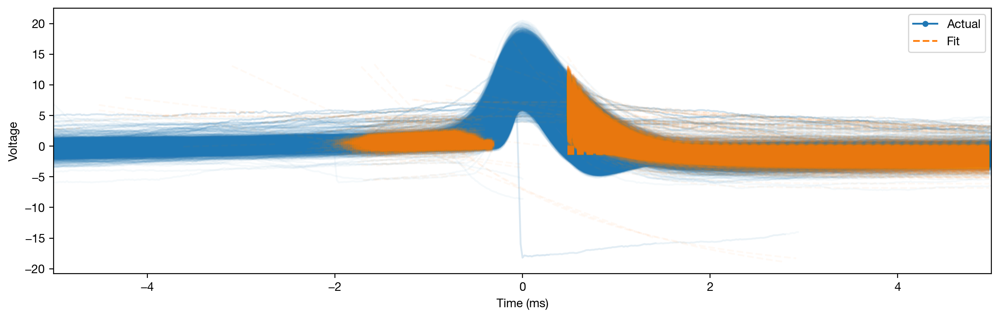

In [12]:
sp.plot()

### Filter spikes 

In [13]:
sp.filter_features()  

### Get spike dataframe (with spike times column)

In [14]:

df_features = sp.df_features

#add columns for spike times, both in idx and ms
df_features['spk_times_idx'] = sp.spike_inds
df_features['spk_times_ms'] = patch_times[sp.spike_inds]
df_features['spk_id'] = range(len(df_features))

In [15]:
df_features

,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,log_isi,spk_times_idx,spk_times_ms,spk_id
0,0.030786,0.28,0.200051,7.895348,0.30,2.490041,0.000026,-0.880492,1.824179,53650,1.072487e+03,0
1,0.185567,0.26,0.442928,7.949770,0.30,2.641294,0.000002,-0.294561,1.631439,56987,1.139196e+03,1
2,0.877363,0.26,0.629470,7.800408,0.32,2.410221,0.000010,-0.435603,1.717796,59128,1.181995e+03,2
3,-0.052398,0.28,0.314866,7.699788,0.30,2.396309,0.000004,-0.445957,1.440387,61740,1.234210e+03,3
4,0.087457,0.28,0.582596,8.028814,0.32,2.347654,0.000003,-0.362595,1.215166,63119,1.261777e+03,4
...,...,...,...,...,...,...,...,...,...,...,...,...
12556,0.075823,0.38,0.147030,6.220482,0.40,1.113120,0.000015,-1.071736,1.615953,53934028,1.078165e+06,12551
12557,-0.070153,0.36,0.126203,6.108001,0.42,0.976829,0.000012,-0.968436,1.674837,53936094,1.078207e+06,12552
12558,0.116481,0.36,0.503001,6.513055,0.40,0.944731,0.000010,-0.534537,1.667992,53938460,1.078254e+06,12553
12559,0.036199,0.38,0.324115,6.458305,0.42,0.761761,0.000003,-0.770707,1.598364,53940789,1.078300e+06,12554


### Get spike times


In [16]:
spk_times_idx = df_features['spk_times_idx']
spk_times_ms = df_features['spk_times_ms']
spk_ids = df_features['spk_id']

In [17]:
df_features.columns

Index(['ramp_amp', 'inflection_time', 'inflection_amp', 'peak_amp',
       'peak_width', 'peak_sharpness', 'exp_lambda', 'exp_const', 'log_isi',
       'spk_times_idx', 'spk_times_ms', 'spk_id'],
      dtype='object')

## STEP 2: Cluster spike groups 

#### Plot distribution of all features

Plotting spike features...
Removing outliers using IQR method (multiplier=3)


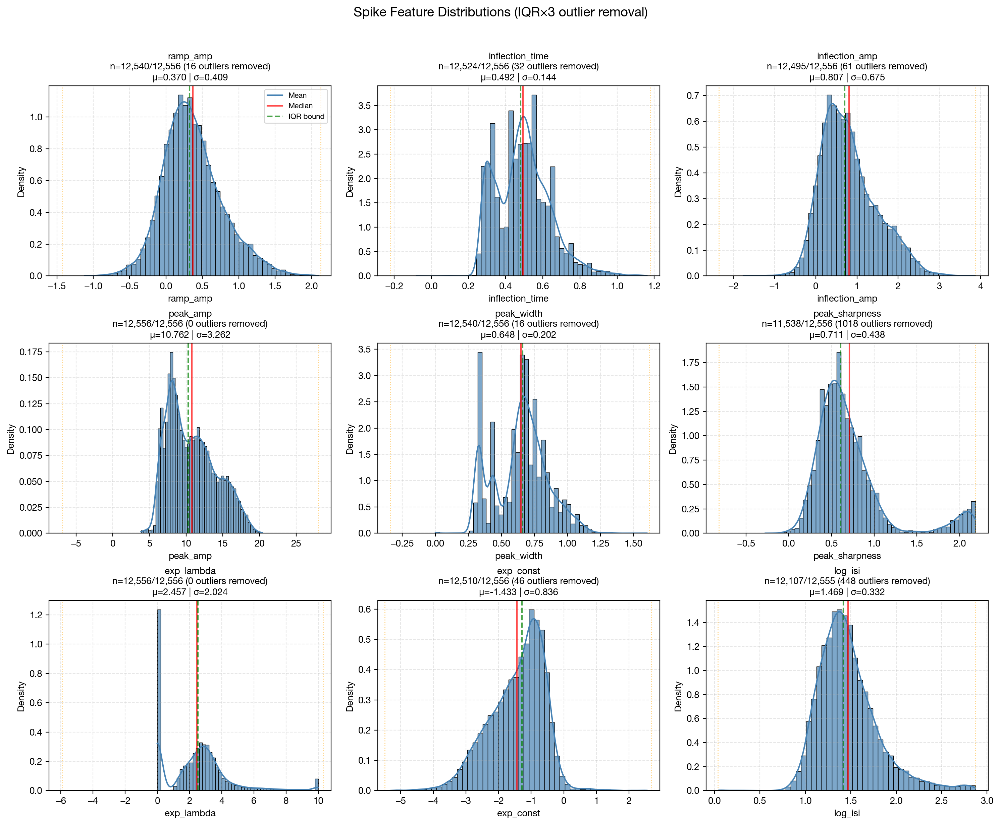


FEATURE DISTRIBUTION SUMMARY
Feature              Total N    Clean N    Outliers   % Removed  Mean       Std       
------------------------------------------------------------------------------------------
ramp_amp             12556      12540      16         0.1        0.370      0.409     
inflection_time      12556      12524      32         0.3        0.492      0.144     
inflection_amp       12556      12495      61         0.5        0.807      0.675     
peak_amp             12556      12556      0          0.0        10.762     3.262     
peak_width           12556      12540      16         0.1        0.648      0.202     
peak_sharpness       12556      11538      1018       8.1        0.711      0.438     
exp_lambda           12556      12556      0          0.0        2.457      2.024     
exp_const            12556      12510      46         0.4        -1.433     0.836     
log_isi              12555      12107      448        3.6        1.469      0.332     


In [18]:
plot_spike_feature_distributions(df_features)

In [19]:
cluster_pickle = os.path.join(SPE1_PICKLE_ROOT, 'cluster_pickles', f'c{cell_num}_cluster_df.pkl')

if FORCE_CLUSTER or not os.path.exists(cluster_pickle):
    # scan all numeric features and only cluster the ones that look multimodal
    df_features_clust, rep = cluster_multimodal_features(
        df_features.drop(["spk_times_idx"], axis = 1),
        max_k=3,
        suffix="_cluster",
        plot_each=True,  # set True if you want a quick plot per clustered feature, 
        manual_thresholds={'peak_amp':(9,14), 'peak_sharpness':1.5, 'peak_width':(0.35, 0.5)
        }
    )
    
    with open(cluster_pickle, 'wb') as f:
        pickle.dump(df_features_clust, f)
    print(f"  Saved: {os.path.basename(cluster_pickle)}")
else:
    print(f"  [cache] {os.path.basename(cluster_pickle)}")
    with open(cluster_pickle, 'rb') as f:
        df_features_clust = pickle.load(f)


  [cache] c21_cluster_df.pkl



===== CLUSTER REPORT: peak_amp_cluster =====
Found 3 clusters: ['high', 'low', 'mid']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low', 'mid']
  Groups: ('low', 'mid', 'high')
  Group names: ('Low', 'Mid', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:179: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


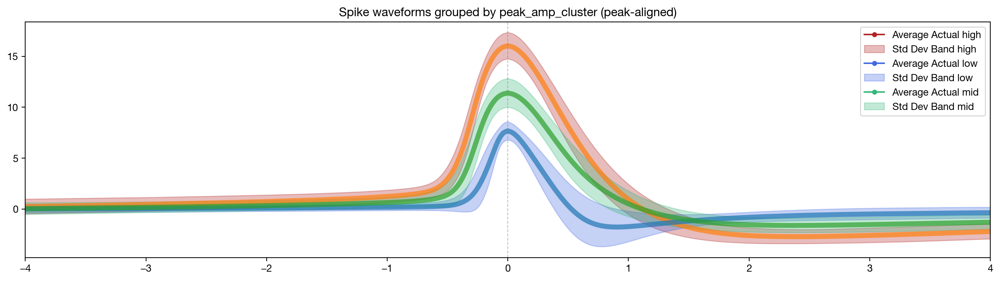


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:997: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


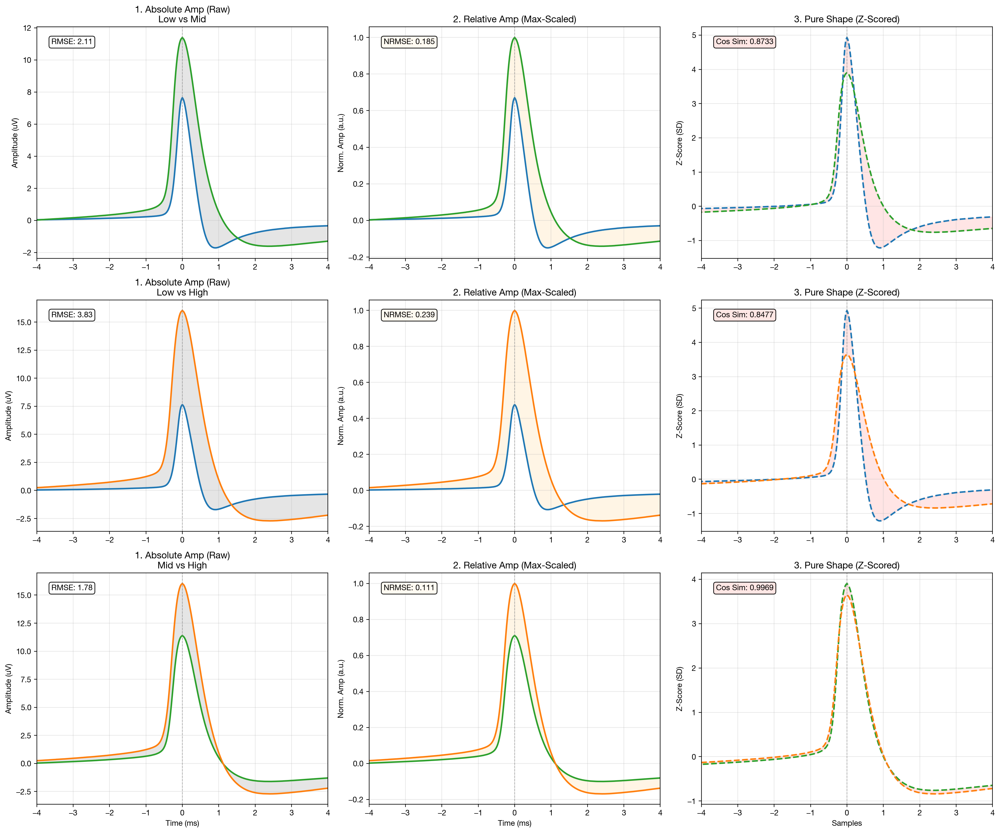


→ 2. Plotting cluster proportions over time


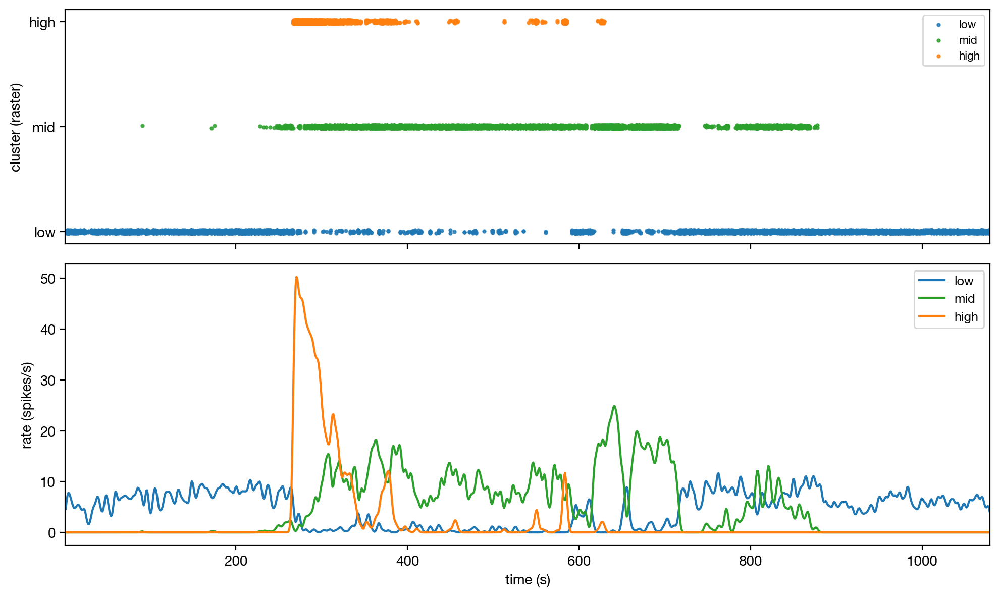


→ 3. Computing cluster transition matrix


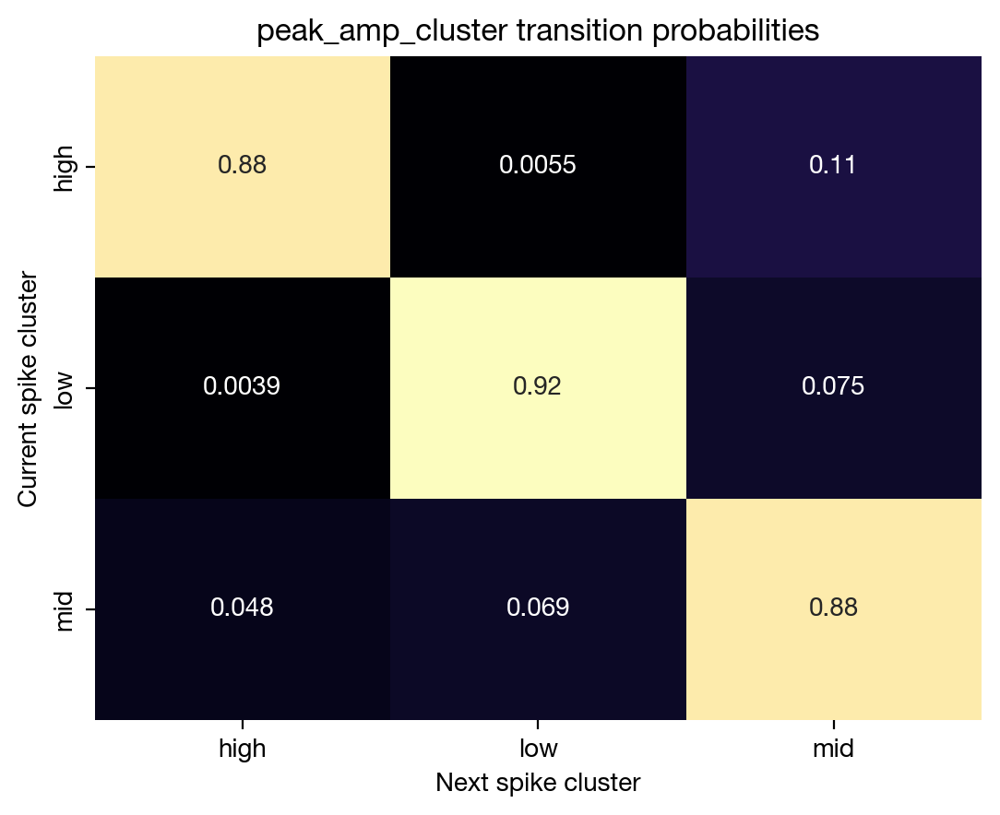


→ 4. Visualizing feature distributions by cluster


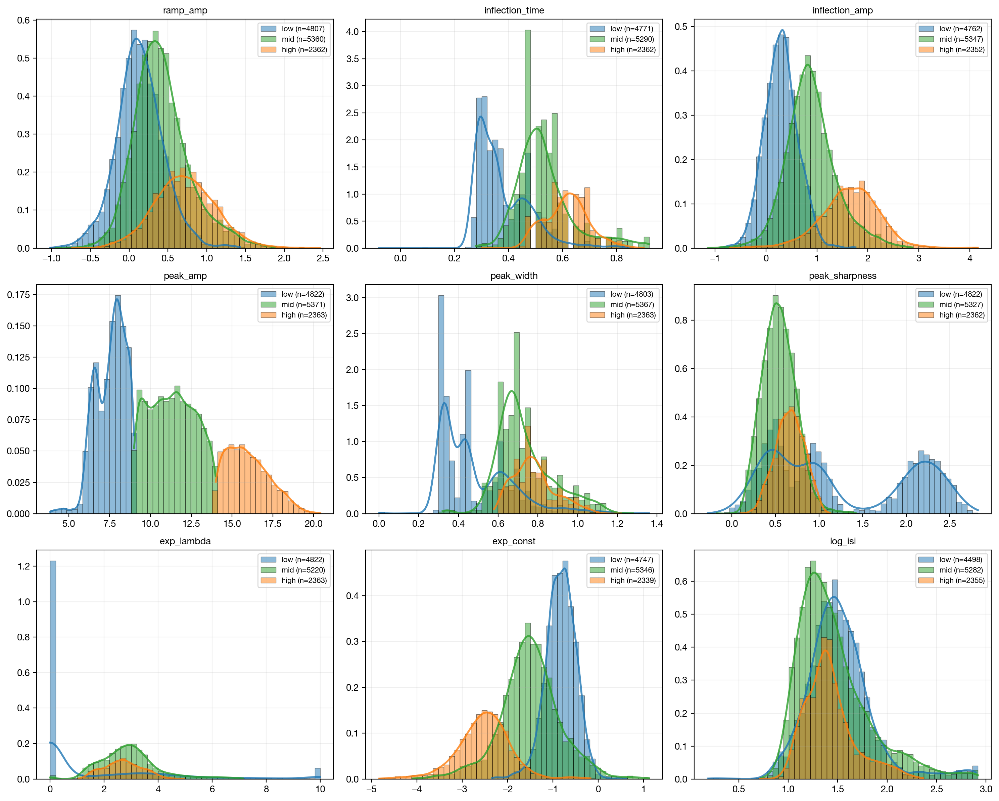


→ 5. Statistical analysis for: peak_amp
----------------------------------------

Test: Kruskal-Wallis (nonparametric)
Number of groups: 3
P-value: 0.000000
Significance: ***
η² effect size: 0.858
Interpretation: Very Large


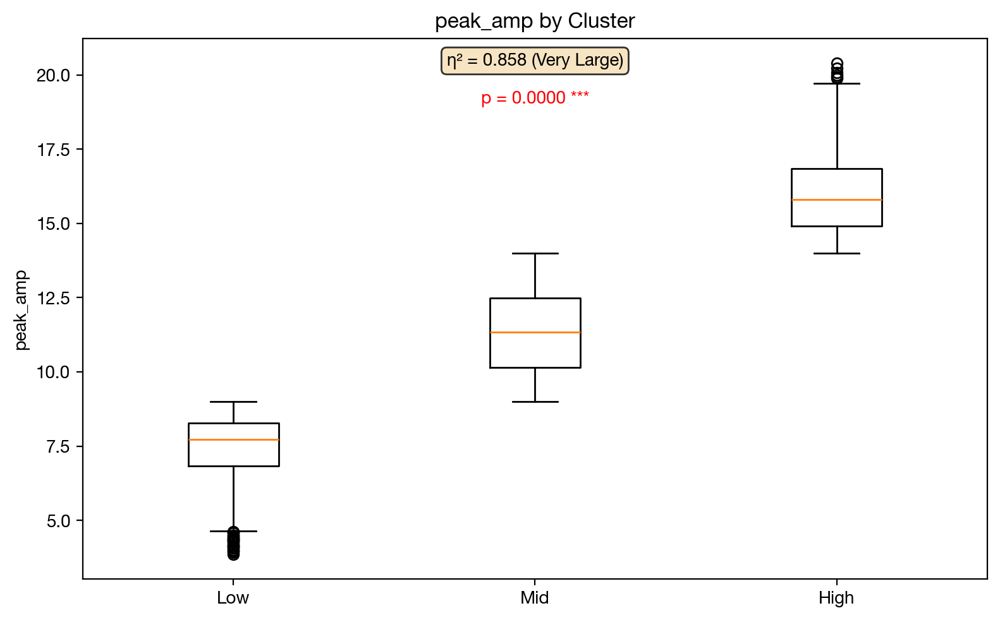


===== REPORT COMPLETE =====


===== CLUSTER REPORT: peak_width_cluster =====
Found 3 clusters: ['high', 'low', 'mid']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low', 'mid']
  Groups: ('low', 'mid', 'high')
  Group names: ('Low', 'Mid', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:179: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


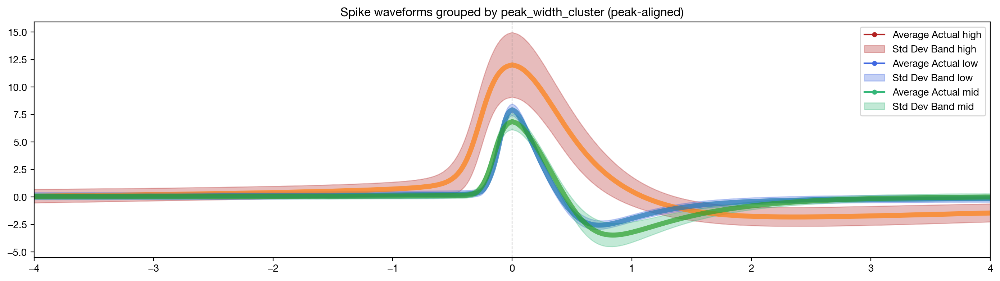


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:997: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


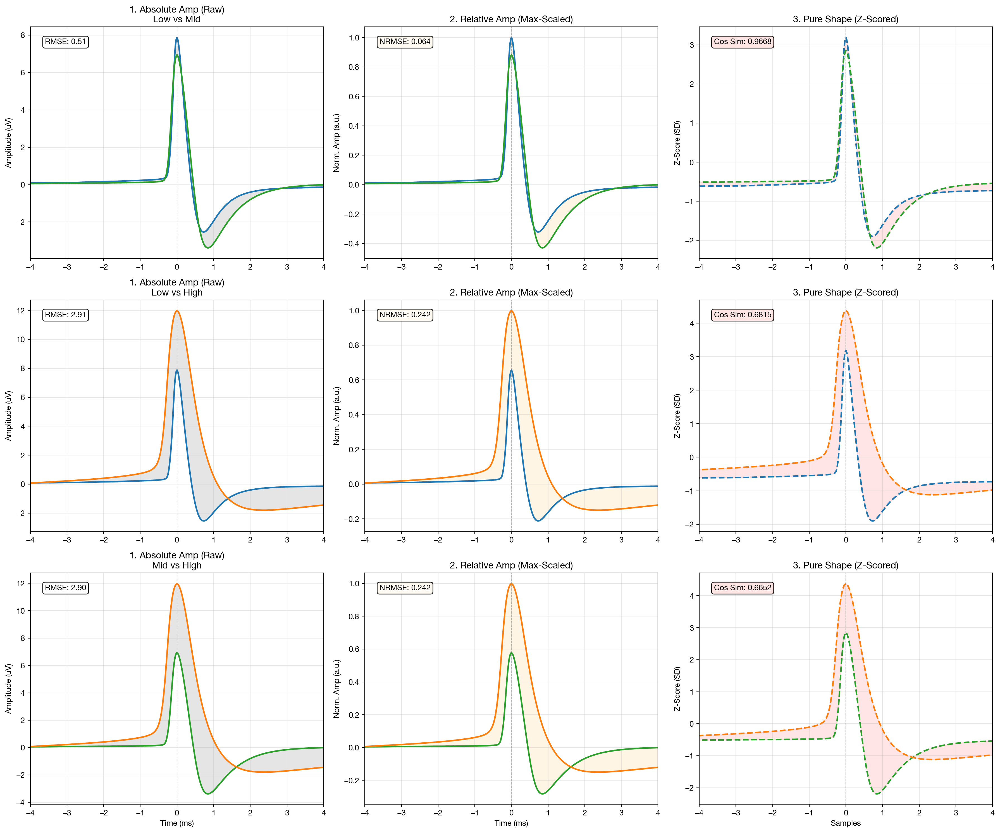


→ 2. Plotting cluster proportions over time


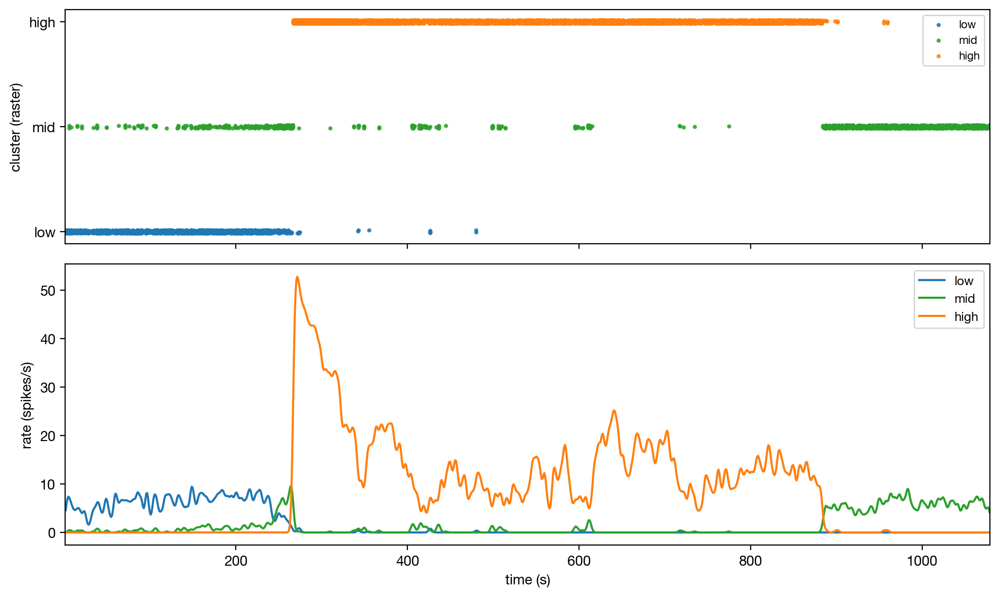


→ 3. Computing cluster transition matrix


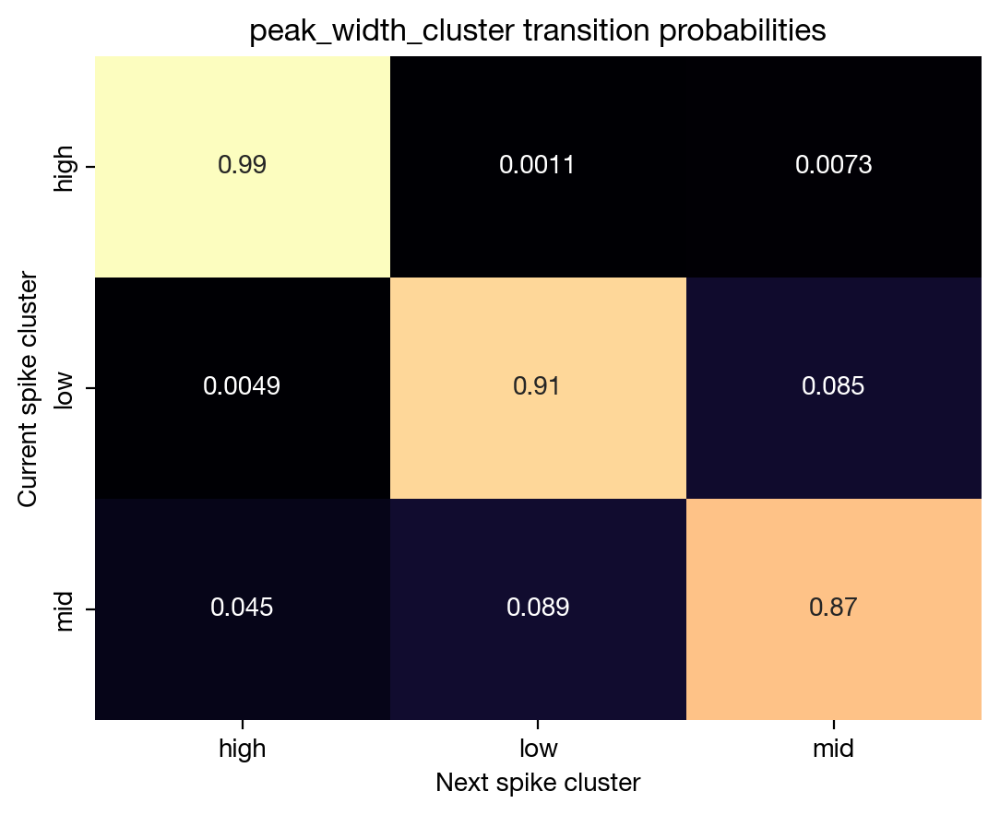


→ 4. Visualizing feature distributions by cluster


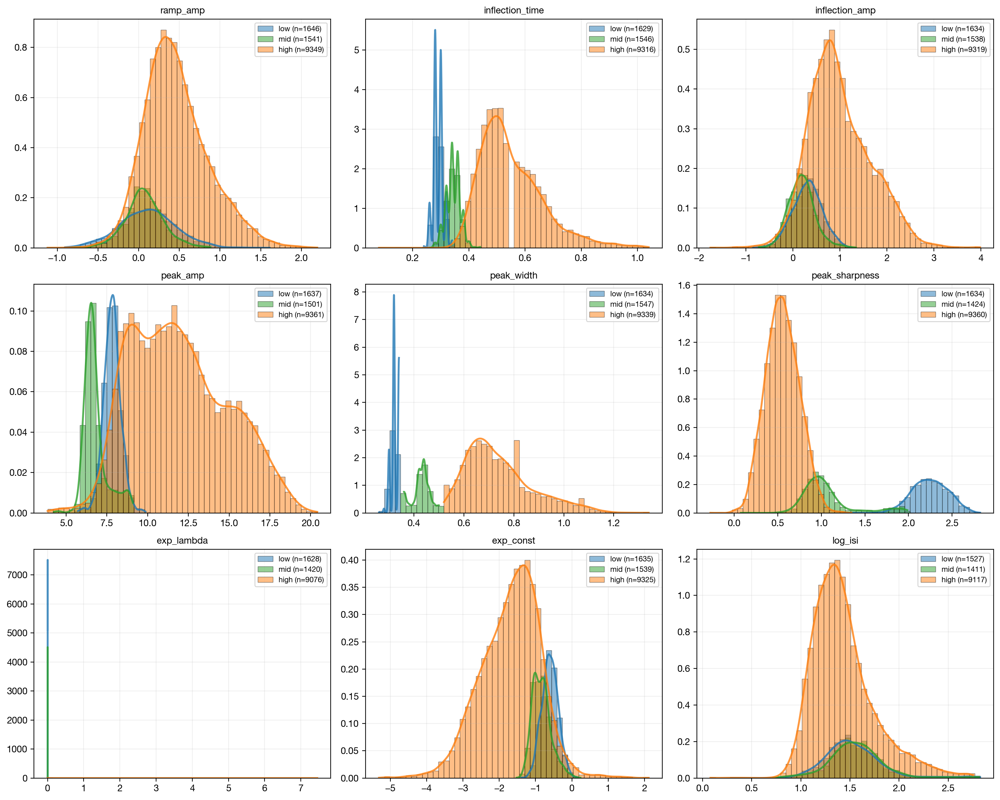


→ 5. Statistical analysis for: peak_width
----------------------------------------

Test: Kruskal-Wallis (nonparametric)
Number of groups: 3
P-value: 0.000000
Significance: ***
η² effect size: 0.582
Interpretation: Very Large


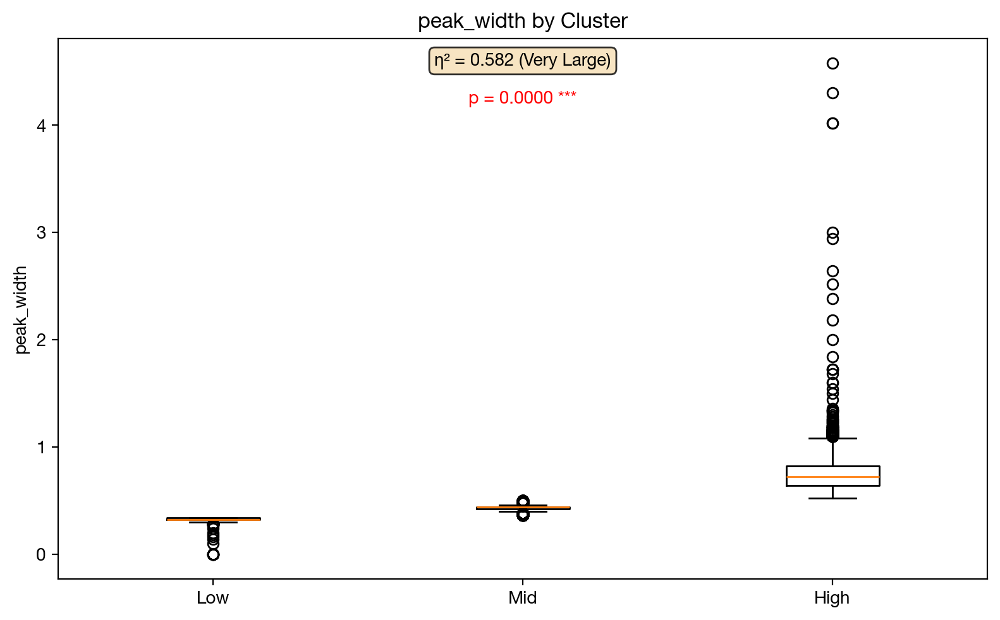


===== REPORT COMPLETE =====


===== CLUSTER REPORT: peak_sharpness_cluster =====
Found 2 clusters: ['high', 'low']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low']
  Groups: ('low', 'high')
  Group names: ('Low', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:179: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


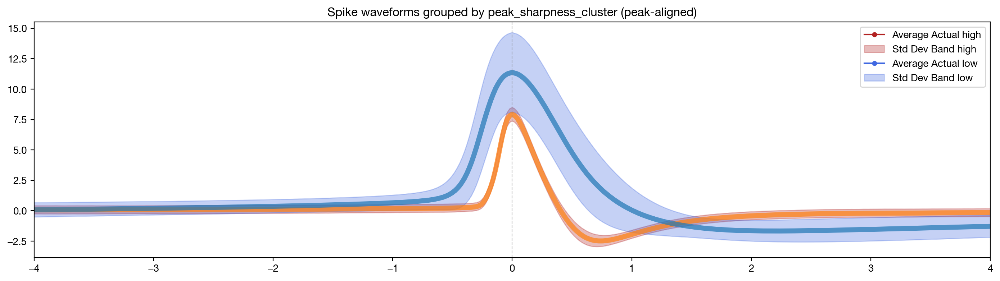


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:997: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


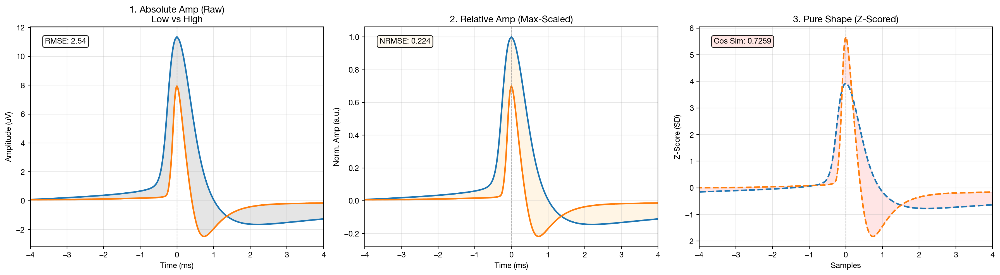


→ 2. Plotting cluster proportions over time


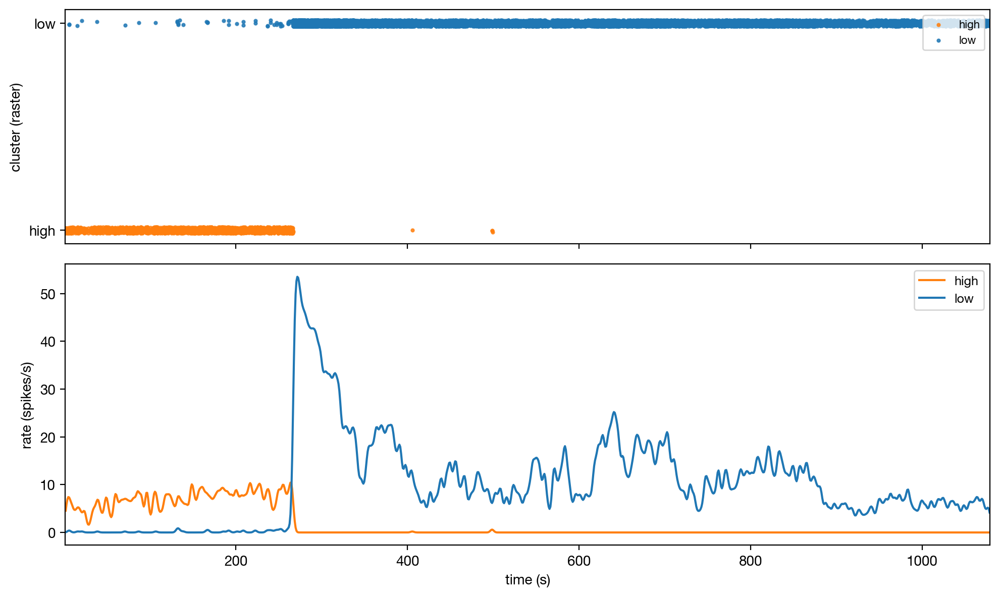


→ 3. Computing cluster transition matrix


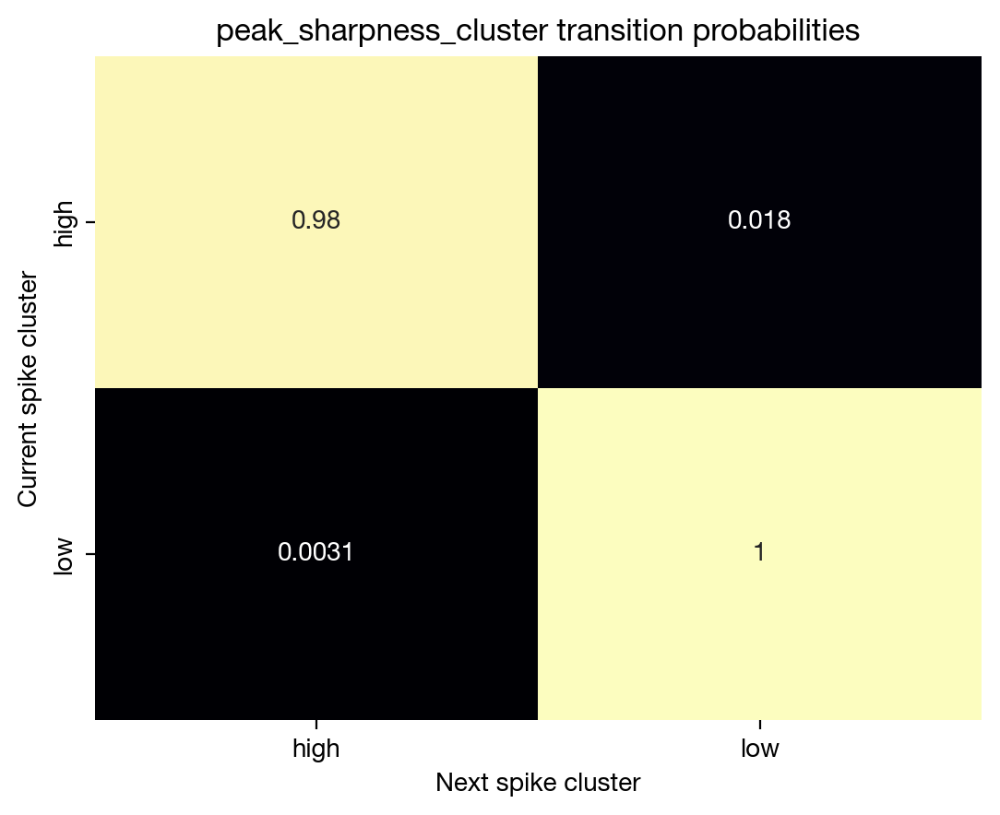


→ 4. Visualizing feature distributions by cluster


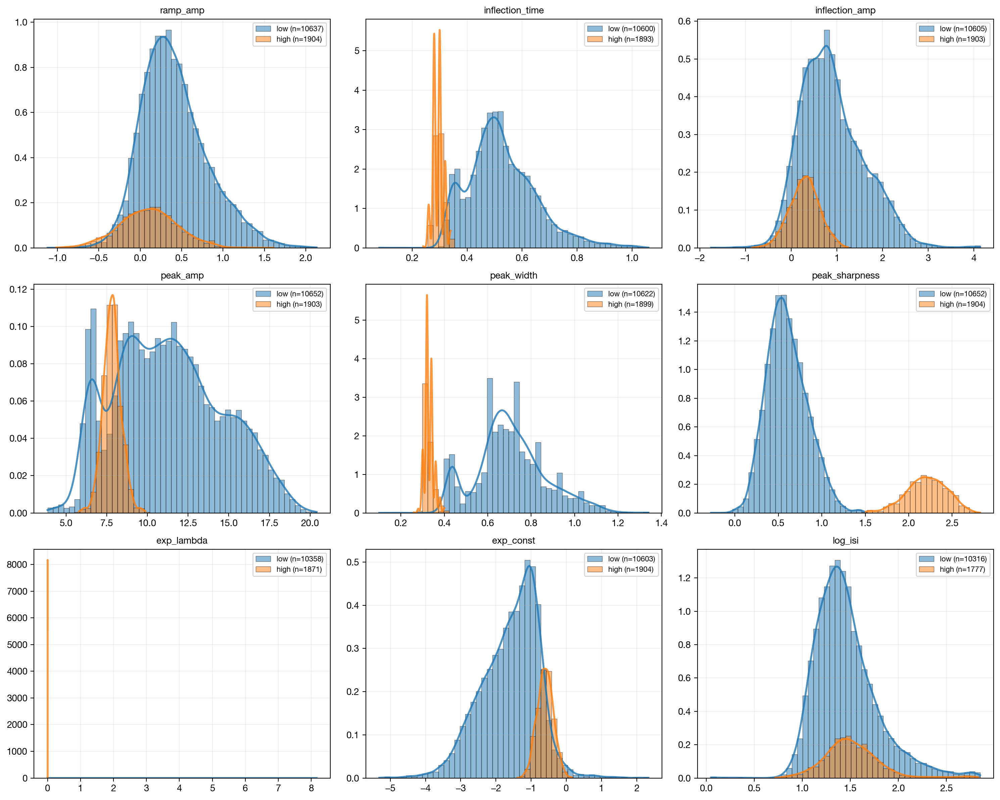


→ 5. Statistical analysis for: peak_sharpness
----------------------------------------

Test: Mann-Whitney U (nonparametric)
Number of groups: 2
P-value: 0.000000
Significance: ***
η² effect size: 0.859
Interpretation: Very Large


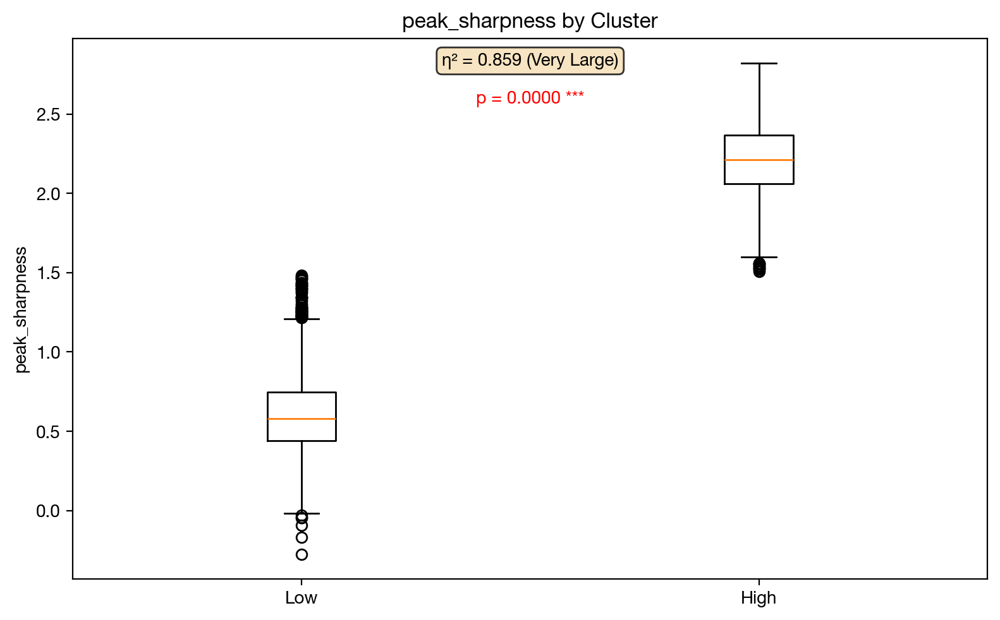


===== REPORT COMPLETE =====


===== CLUSTER REPORT: spk_times_ms_cluster =====
Found 3 clusters: ['high', 'low', 'mid']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low', 'mid']
  Groups: ('low', 'mid', 'high')
  Group names: ('Low', 'Mid', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:179: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


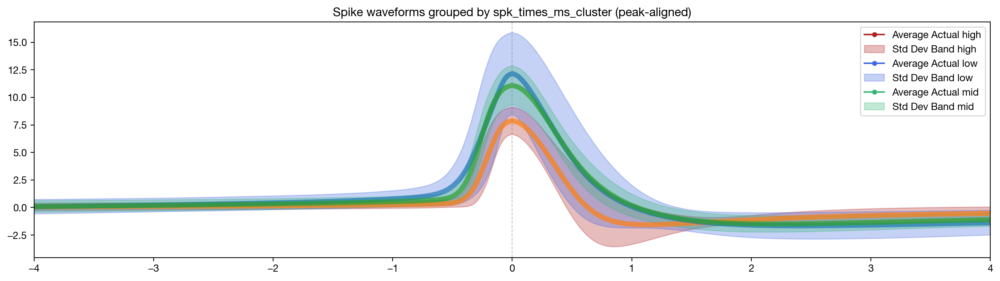


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:997: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


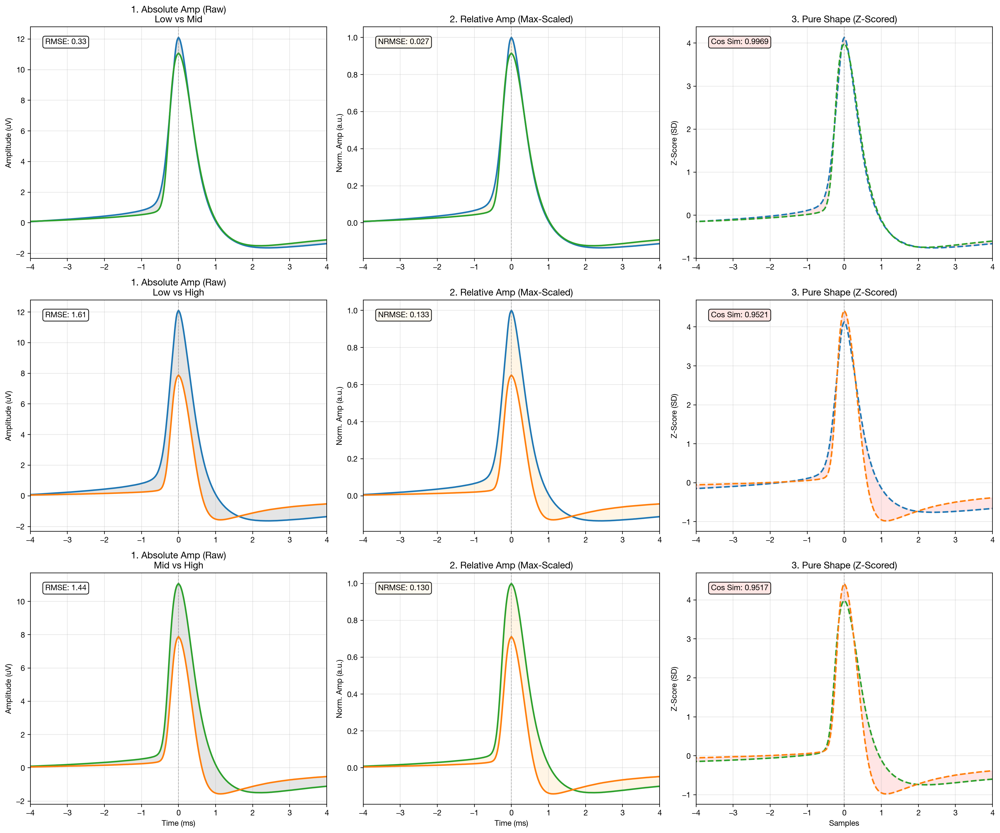


→ 2. Plotting cluster proportions over time


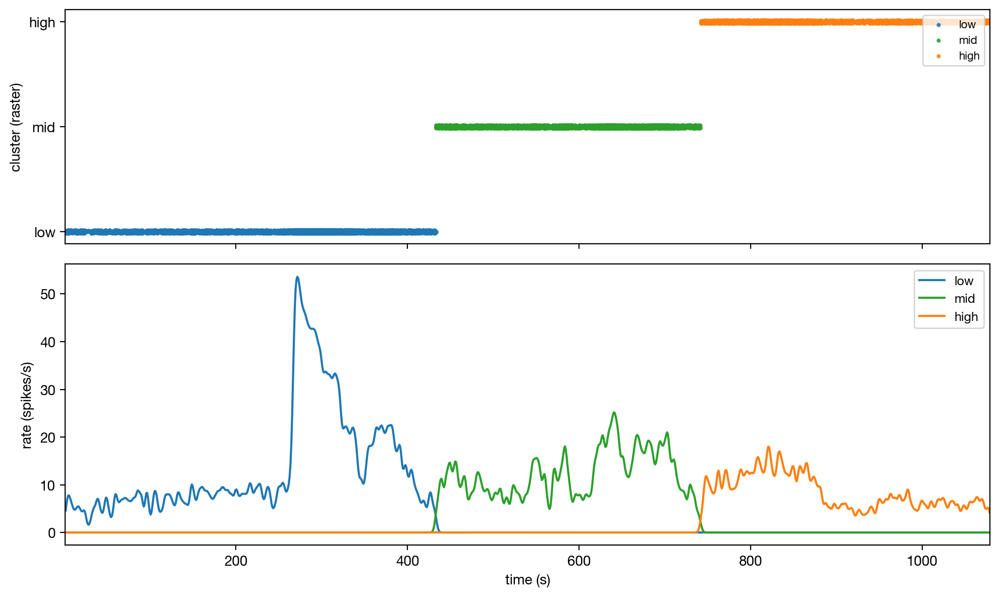


→ 3. Computing cluster transition matrix


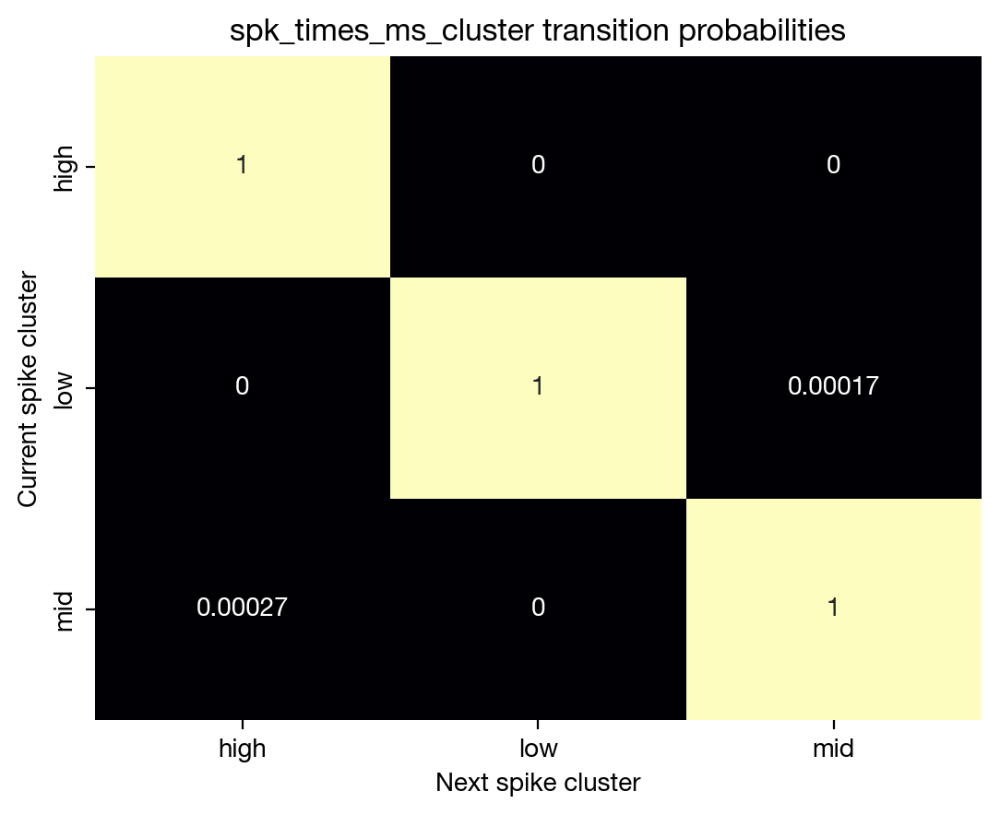


→ 4. Visualizing feature distributions by cluster


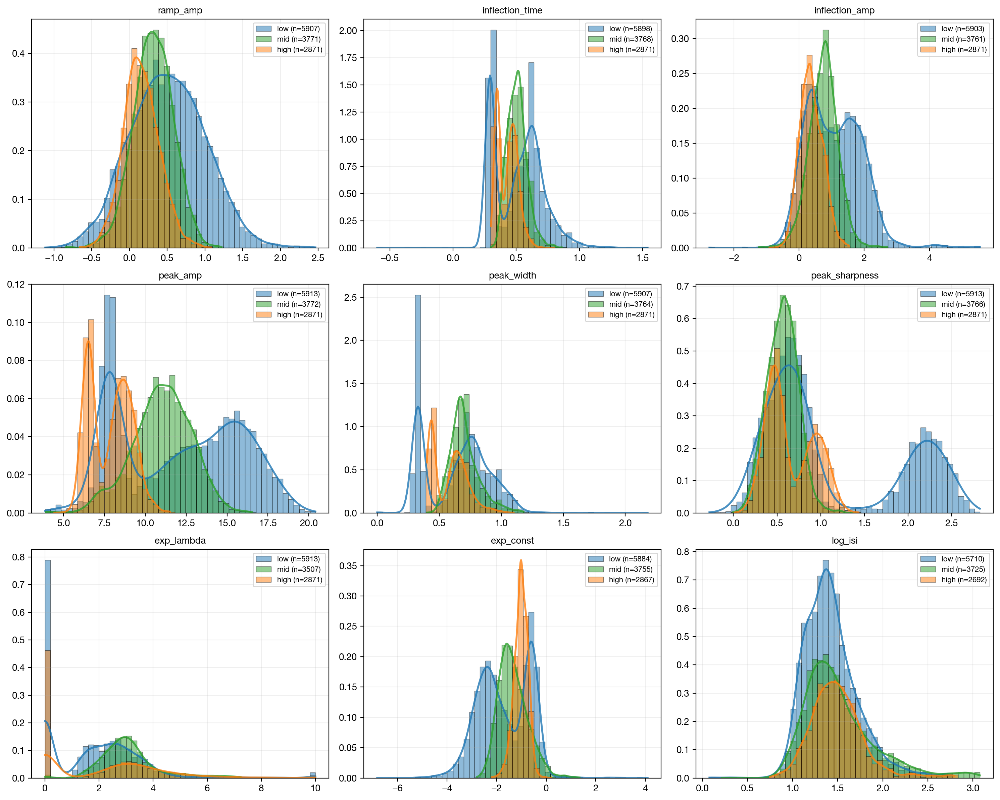


→ 5. Statistical analysis for: spk_times_ms
----------------------------------------

Test: Kruskal-Wallis (nonparametric)
Number of groups: 3
P-value: 0.000000
Significance: ***
η² effect size: 0.856
Interpretation: Very Large


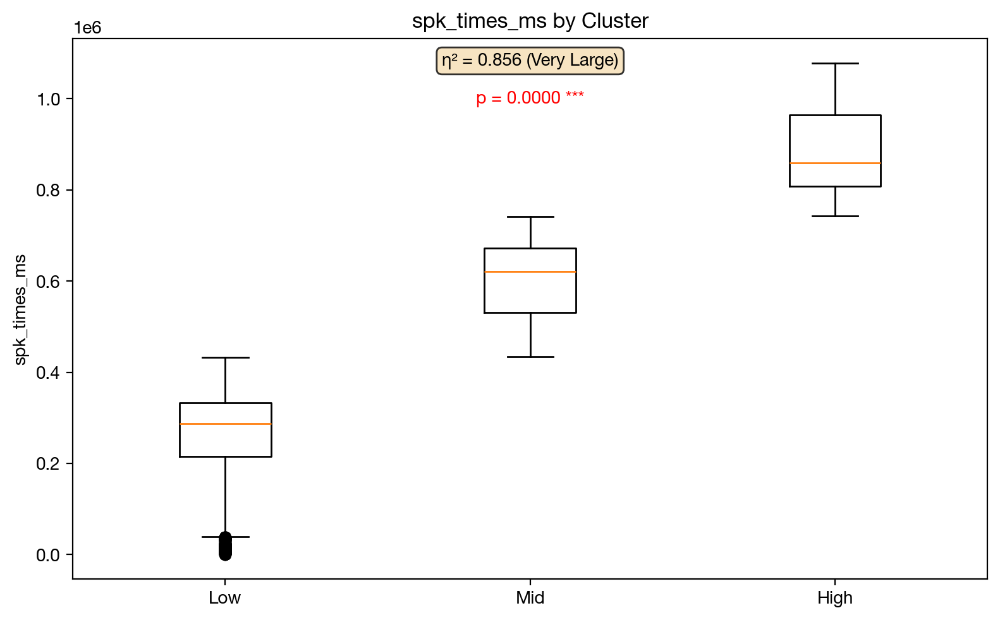


===== REPORT COMPLETE =====



In [20]:
all_reports = []

# Filter columns first to ensure the index is continuous
cluster_cols = [c for c in df_features_clust.columns if c.endswith("_cluster")]

for i, col in enumerate(cluster_cols):
    # Pass 'i' as the cluster_group_id
    row_df = plot_full_cluster_report(df_features_clust, sp, col, cluster_group_id=i)
    all_reports.append(row_df)

# Final Master DataFrame
master_report_df = pd.concat(all_reports, ignore_index=True)

In [21]:
# Save cluster quality report for population-level comparison analysis
report_pickle = os.path.join(SPE1_PICKLE_ROOT, 'cluster_pickles', f'c{cell_num}_cluster_report.pkl')
with open(report_pickle, 'wb') as f:
    pickle.dump(master_report_df, f)


In [22]:
# Compute and save peak-aligned average waveforms for each cluster group.
# Saved to a lightweight pickle used by the population comparison notebook.
wf_pickle = os.path.join(SPE1_PICKLE_ROOT, 'cluster_pickles', f'c{cell_num}_cluster_waveforms.pkl')
if FORCE_CLUSTER or not os.path.exists(wf_pickle):
    cluster_cols = [c for c in df_features_clust.columns if c.endswith('_cluster')]
    wf_data = compute_cluster_waveforms(sp, df_features_clust, cluster_cols)
    with open(wf_pickle, 'wb') as f:
        pickle.dump(wf_data, f)
    print(f"  Saved: {os.path.basename(wf_pickle)}")
else:
    print(f"  [cache] {os.path.basename(wf_pickle)}")


  [cache] c21_cluster_waveforms.pkl


#### Open all pickle chunks and reassamble 

#### Analyze by group

#### Plot avg specparam for each group for significant windows 